In [5]:
from ALLCools.mcds import MCDS
import pandas as pd
import anndata
from scipy.sparse import csr_matrix

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.stats.multitest import multipletests
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
matplotlib.rcParams['figure.dpi'] = 300
matplotlib.rcParams['savefig.transparent'] = True
matplotlib.rcParams['path.simplify'] = False  # keep exact vectors

In [7]:
mcds_paths = './genebody_frac.mcds/'
cell_meta_path = 'L1_clustering_labels.csv'
cluster_col = 'L1'

obs_dim = 'cell'
var_dim = 'genebody'
mc_type = 'CGN'

In [8]:
cell_metaa = pd.read_csv('metadata_allco.csv', sep=',', index_col=0)



cell_metaa['AnimalID'] = cell_metaa['Animal ID'] 
cell_metaa = cell_metaa[cell_metaa['Type'] == "EO"]
cell_metaa

,Animal ID,Group,Sample Name,Type,# Read,% mCpG,Group.1,Path,AnimalID
SampleID,,,,,,,,,
4520845054EO2NC8E7S,45208,Stressed,45208_45054_EO2_NC8_E7_1_val_1,EO,600000,0.709,Stressed,mv 45208_45054_EO2_NC8_E7_1_val_1_bismark_bt2_...,45208
4247345061EO1NC8O4S,42473,Stressed,42473_45061_EO1_NC8_O4_1_val_1,EO,1500000,0.670,Stressed,mv 42473_45061_EO1_NC8_O4_1_val_1_bismark_bt2_...,42473
4520845054EO3NC8F7S,45208,Stressed,45208_45054_EO3_NC8_F7_1_val_1,EO,1800000,0.724,Stressed,mv 45208_45054_EO3_NC8_F7_1_val_1_bismark_bt2_...,45208
4305145068EO1NC8M5S,43051,Stressed,43051_45068_EO1_NC8_M5_1_val_1,EO,2100000,0.671,Stressed,mv 43051_45068_EO1_NC8_M5_1_val_1_bismark_bt2_...,43051
4211145019EOoNC8M4C,42111,Control,42111_45019_EOo_NC8_M4_1_val_1,EO,4800000,0.488,Control,mv 42111_45019_EOo_NC8_M4_1_val_1_bismark_bt2_...,42111
4520845054EO5NC8H7S,45208,Stressed,45208_45054_EO5_NC8_H7_1_val_1,EO,5900000,0.638,Stressed,mv 45208_45054_EO5_NC8_H7_1_val_1_bismark_bt2_...,45208
4305145068EO3NC8O5S,43051,Stressed,43051_45068_EO3_NC8_O5_1_val_1,EO,6100000,0.718,Stressed,mv 43051_45068_EO3_NC8_O5_1_val_1_bismark_bt2_...,43051
4129945019EO6NC8H2S,41299,Stressed,41299_45019_EO6_NC8_H2_1_val_1,EO,7200000,0.699,Stressed,mv 41299_45019_EO6_NC8_H2_1_val_1_bismark_bt2_...,41299
4520845054EO4NC8G7S,45208,Stressed,45208_45054_EO4_NC8_G7_1_val_1,EO,8600000,0.502,Stressed,mv 45208_45054_EO4_NC8_G7_1_val_1_bismark_bt2_...,45208


gene_meta = pd.read_csv('../../GeneMetadata_withGeneName_corrected.csv')
gene_meta["Gene"] = gene_meta["gene_id"]
gene_meta

In [9]:
mcds = MCDS.open(mcds_paths)
mcds['cell'].values


array(['4129945019EO2NC8D2S', '4129945019EO3NC8E2S',
       '4129945019EO4NC8F2S', '4129945019EO5NC8G2S',
       '4129945019EO6NC8H2S', '4129945019EO8NC8J2S',
       '4211145019EOoNC8M4C', '4247345061EO1NC8O4S',
       '4305145068EO1NC8M5S', '4305145068EO3NC8O5S',
       '4520845054BL2NC16J7S', '4520845054BL3NC16K7S',
       '4520845054BL4NC16L7S', '4520845054BL5NC16M7S',
       '4520845054BL6NC16N7S', '4520845054EO1NC8D7S',
       '4520845054EO2NC8E7S', '4520845054EO3NC8F7S',
       '4520845054EO4NC8G7S', '4520845054EO5NC8H7S'], dtype='<U20')

In [10]:
    # Filter metadata to ensure cells align with MCDS cells
cell_meta = cell_metaa[cell_metaa.index.isin(mcds['cell'].values)]
mcds = mcds.sel(cell=cell_meta.index)
cell_meta.index

Index(['4520845054EO2NC8E7S', '4247345061EO1NC8O4S', '4520845054EO3NC8F7S',
       '4305145068EO1NC8M5S', '4211145019EOoNC8M4C', '4520845054EO5NC8H7S',
       '4305145068EO3NC8O5S', '4129945019EO6NC8H2S', '4520845054EO4NC8G7S',
       '4520845054EO1NC8D7S', '4129945019EO8NC8J2S', '4129945019EO5NC8G2S',
       '4129945019EO2NC8D2S', '4129945019EO4NC8F2S', '4129945019EO3NC8E2S'],
      dtype='object', name='SampleID')

In [11]:


def convert_mcds_to_anndata(mcds_path, cell_meta, mc_type='CGN'):
    # Load the MCDS data and metadata
    mcds = MCDS.open(mcds_paths)

    
    # Filter metadata to ensure cells align with MCDS cells
    cell_meta = cell_metaa[cell_metaa.index.isin(mcds['cell'].values)]
    mcds = mcds.sel(cell=cell_meta.index)
    
    # Extract methylation fraction data directly from `genebody_da_frac`
    methylation_data = mcds['genebody_da_frac'].sel(mc_type=mc_type).values

    # Convert methylation data to a sparse matrix to save memory
    methylation_data = csr_matrix(methylation_data)

    # Create AnnData with methylation fraction matrix as `X`
    adata = anndata.AnnData(X=methylation_data)
    
    # Set cell-level metadata
    adata.obs = cell_meta
    
    # Set gene-level metadata
    adata.var = pd.DataFrame({
        'gene_id': mcds['genebody'].values,
        'chrom': mcds['genebody_chrom'].values,
        'start': mcds['genebody_start'].values,
        'end': mcds['genebody_end'].values
    }, index=mcds['genebody'].values)
    
    # Optionally, add the methylation fraction as a layer if needed for future analysis
    adata.layers['methylation_fraction'] = methylation_data

    return adata



In [12]:
#Convert MCDS to AnnData
adata = convert_mcds_to_anndata(mcds_paths, cell_metaa, mc_type='CGN')
adata.write_h5ad("embryo-only/adataFromgenebodyFrac_mCG_Embryoonly.h5ad")
adata.obs_names

Index(['4520845054EO2NC8E7S', '4247345061EO1NC8O4S', '4520845054EO3NC8F7S',
       '4305145068EO1NC8M5S', '4211145019EOoNC8M4C', '4520845054EO5NC8H7S',
       '4305145068EO3NC8O5S', '4129945019EO6NC8H2S', '4520845054EO4NC8G7S',
       '4520845054EO1NC8D7S', '4129945019EO8NC8J2S', '4129945019EO5NC8G2S',
       '4129945019EO2NC8D2S', '4129945019EO4NC8F2S', '4129945019EO3NC8E2S'],
      dtype='object', name='SampleID')

In [13]:
adata.obs_names = adata.obs_names.astype(str)


In [14]:
adataembryo = adata
adataembryo.obs_names

Index(['4520845054EO2NC8E7S', '4247345061EO1NC8O4S', '4520845054EO3NC8F7S',
       '4305145068EO1NC8M5S', '4211145019EOoNC8M4C', '4520845054EO5NC8H7S',
       '4305145068EO3NC8O5S', '4129945019EO6NC8H2S', '4520845054EO4NC8G7S',
       '4520845054EO1NC8D7S', '4129945019EO8NC8J2S', '4129945019EO5NC8G2S',
       '4129945019EO2NC8D2S', '4129945019EO4NC8F2S', '4129945019EO3NC8E2S'],
      dtype='object', name='SampleID')

In [15]:
adataoocyte = anndata.read_h5ad("../../alloocytes/results-pooled/hdWGBS/adataFromgenebodyFrac_mCG.h5ad")
adataoocyte.obs_names

Index(['4146045001PO3NC4G4C', '4129944963PO2NC4M1S', '4520844650PO1NC5A7S',
       '4146045001PO2NC3F4C', '4520844650PO2NC3B7S', '3905345005PO1NC2I1S',
       '4129944963PO1NC3N1S', '4211144957PO1NC3K4C', '4660644938PO2NC3A10C',
       '4139144923PO4NC4K3C', '4598244908PO1NC3J8C', '4598244908PO2NC4K8C',
       '4566944964PO2NC4C7C', '4129944963PO3NC3O1S', '4139144923PO3NC5J3C',
       '4566944964PO3NC3D8C', '4265145042PO3NC4G5S', '4598245001PO2NC4F8C',
       '4499445005PO2NC3C5C', '4660644993PO2NC5D10C', '4566944964PO4NC3E8C',
       '4660644938PO3NC5B10C', '4636344664PO1NC5L9C', '4566944700PO1NC5O8C',
       '4636344914PO1NC4H9C', '4265145042PO2NC4N4S', '4660644993PO3NC5E10C',
       '4211144957PO2NC3L4C', '3889744700PO1NC5D1S', '4265145042PO1NC3E5S',
       '4660644993PO4NC5F10C', '4146044643PO3NC5A4C', '4146045001PO1NC5E4C',
       '4139144650PO1NC4F3C', '4139144650PO2NC4G3C', '4520844650PO3NC5C8S',
       '4566944700PO2NC5P8C', '4146044643PO1NC5O3C', '4456444991PO1NC3H6C',
       

In [16]:
adataembryo.layers['methylation_fraction'].data


array([1.251523  , 1.2453799 , 1.1828555 , ..., 0.42035067, 1.1652611 ,
       1.        ], dtype=float32)

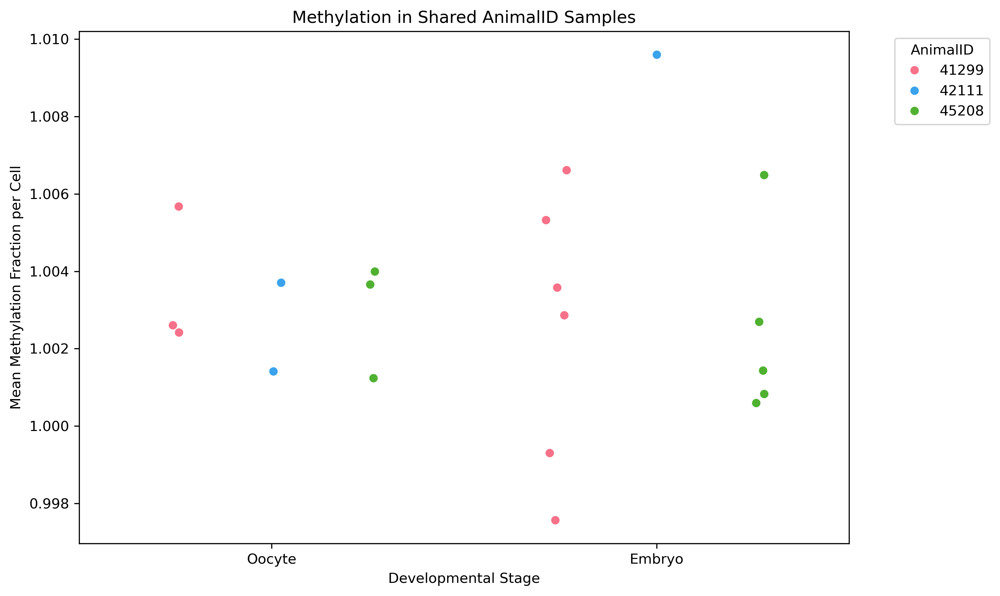

In [18]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure obs_names are strings
adataoocyte.obs_names = adataoocyte.obs_names.astype(str)
adataembryo.obs_names = adataembryo.obs_names.astype(str)

# Find common AnimalIDs
common_animal_ids = np.intersect1d(adataoocyte.obs['AnimalID'], adataembryo.obs['AnimalID'])

# Filter to shared AnimalIDs
adataoocyte_shared = adataoocyte[adataoocyte.obs['AnimalID'].isin(common_animal_ids)].copy()
adataembryo_shared = adataembryo[adataembryo.obs['AnimalID'].isin(common_animal_ids)].copy()

# Flatten mean methylation
def flatten_mean(x):
    mean = x.mean(axis=1)
    return mean.A1 if hasattr(mean, "A1") else np.ravel(mean)

oocyte_meth = flatten_mean(adataoocyte_shared.layers['methylation_fraction'])
embryo_meth = flatten_mean(adataembryo_shared.layers['methylation_fraction'])

# Combine oocyte and embryo stage values
oocyte_types = ['Oocyte'] * adataoocyte_shared.n_obs  # or adataoocyte_shared.obs['Type'].tolist() if available
embryo_types = adataembryo_shared.obs['Type'].tolist()

# Build plot DataFrame
df = pd.DataFrame({
    'Sample': list(adataoocyte_shared.obs_names) + list(adataembryo_shared.obs_names),
    'Methylation': np.concatenate([oocyte_meth, embryo_meth]),
    'AnimalID': adataoocyte_shared.obs['AnimalID'].tolist() + adataembryo_shared.obs['AnimalID'].tolist(),
    'Stage': ['Oocyte'] * adataoocyte_shared.n_obs + ['Embryo'] * adataembryo_shared.n_obs,
    'Embryo_stage': oocyte_types + embryo_types  # oocyte entries will just be "Oocyte" or filler
})

# Assign colors
unique_animals = df['AnimalID'].unique()
animal_colors = dict(zip(unique_animals, sns.color_palette('husl', len(unique_animals))))
df['Color'] = df['AnimalID'].map(animal_colors)

# Plot
plt.figure(figsize=(10, 6))
sns.stripplot(data=df, x='Stage', y='Methylation', hue='AnimalID', dodge=True, jitter=True,
              palette=animal_colors, size=6)

plt.title("Methylation in Shared AnimalID Samples")
plt.ylabel("Mean Methylation Fraction per Cell")
plt.xlabel("Developmental Stage")
plt.legend(title='AnimalID', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.savefig("embryo-only/methylation_by_stage_shared_animals_embryo.png", dpi=300)
plt.show()


In [19]:
# ── 1) Load your “gene of interest” list ──
genes_df = pd.read_csv("../../alloocytes/results-pooled/mCG_genenames_coords_withlifted.csv", sep=",")

# View original column names to rename them correctly
print(genes_df.columns.tolist())

# Then rename if needed
genes_df.columns = ["gene_id", "chr", "start", "end", "genename"]

# Check result
genes_df.head()

['ENSMMUG00000053525', 'chr1', '100564811', '100569887', 'MCL1']


,gene_id,chr,start,end,genename
0,ENSMMUG00000054615,chr1,101331787,101333472,NaN
1,ENSMMUG00000053737,chr1,133742526,133752842,BARHL2
2,ENSMMUG00000063102,chr1,204242900,204245913,CAMK2N1
3,ENSMMUG00000016814,chr10,43467723,43471378,THBD
4,ENSMMUG00000010410,chr10,43927729,43933713,FOXA2


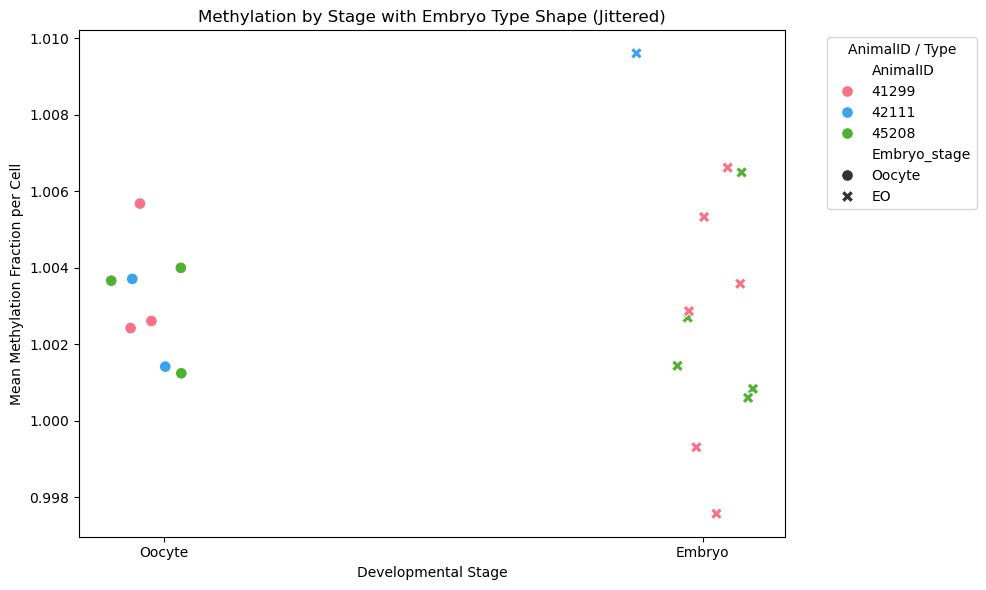

In [14]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure sample names are strings
adataoocyte.obs_names = adataoocyte.obs_names.astype(str)
adataembryo.obs_names = adataembryo.obs_names.astype(str)

# Shared AnimalIDs
common_animal_ids = np.intersect1d(adataoocyte.obs['AnimalID'], adataembryo.obs['AnimalID'])
adataoocyte_shared = adataoocyte[adataoocyte.obs['AnimalID'].isin(common_animal_ids)].copy()
adataembryo_shared = adataembryo[adataembryo.obs['AnimalID'].isin(common_animal_ids)].copy()

# Flatten methylation
def flatten_mean(x):
    mean = x.mean(axis=1)
    return mean.A1 if hasattr(mean, "A1") else np.ravel(mean)

oocyte_meth = flatten_mean(adataoocyte_shared.layers['methylation_fraction'])
embryo_meth = flatten_mean(adataembryo_shared.layers['methylation_fraction'])

# Stage and embryo type info
oocyte_types = ['Oocyte'] * adataoocyte_shared.n_obs
embryo_types = adataembryo_shared.obs['Type'].tolist()

df = pd.DataFrame({
    'Sample': list(adataoocyte_shared.obs_names) + list(adataembryo_shared.obs_names),
    'Methylation': np.concatenate([oocyte_meth, embryo_meth]),
    'AnimalID': adataoocyte_shared.obs['AnimalID'].tolist() + adataembryo_shared.obs['AnimalID'].tolist(),
    'Stage': ['Oocyte'] * adataoocyte_shared.n_obs + ['Embryo'] * adataembryo_shared.n_obs,
    'Embryo_stage': oocyte_types + embryo_types  # oocytes show as 'Oocyte'
})

# Assign color by AnimalID
unique_animals = df['AnimalID'].unique()
animal_colors = dict(zip(unique_animals, sns.color_palette('husl', len(unique_animals))))
df['Color'] = df['AnimalID'].map(animal_colors)

# Add jittered x-values manually
x_map = {'Oocyte': 0, 'Embryo': 1}
df['x'] = df['Stage'].map(x_map) + np.random.normal(0, 0.05, size=len(df))

# Plot with manual jitter
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=df,
    x='x',
    y='Methylation',
    hue='AnimalID',
    style='Embryo_stage',
    palette=animal_colors,
    s=70
)

# Format axes
plt.xticks([0, 1], ['Oocyte', 'Embryo'])
plt.title("Methylation by Stage with Embryo Type Shape (Jittered)")
plt.ylabel("Mean Methylation Fraction per Cell")
plt.xlabel("Developmental Stage")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='AnimalID / Type')
plt.tight_layout()
plt.savefig("embryo-only/methylation_stage_shape_jittered.png", dpi=300)
plt.show()


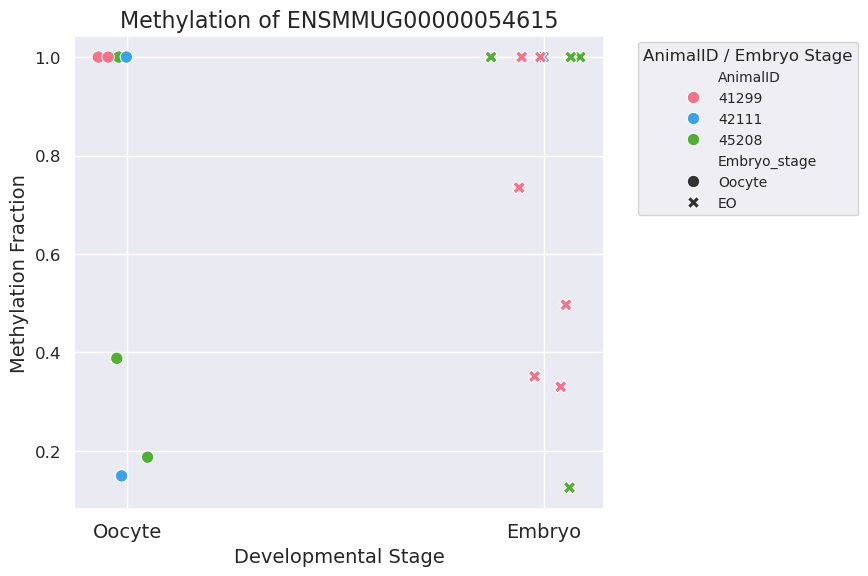

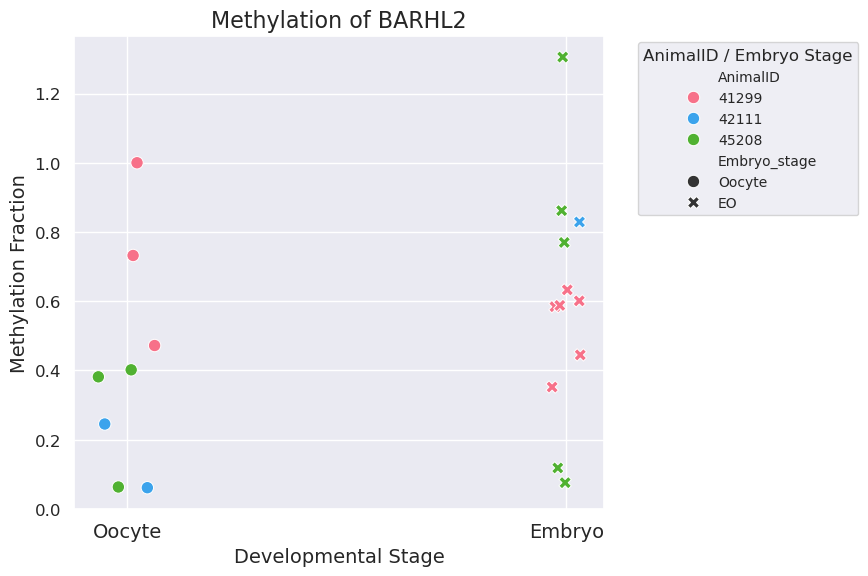

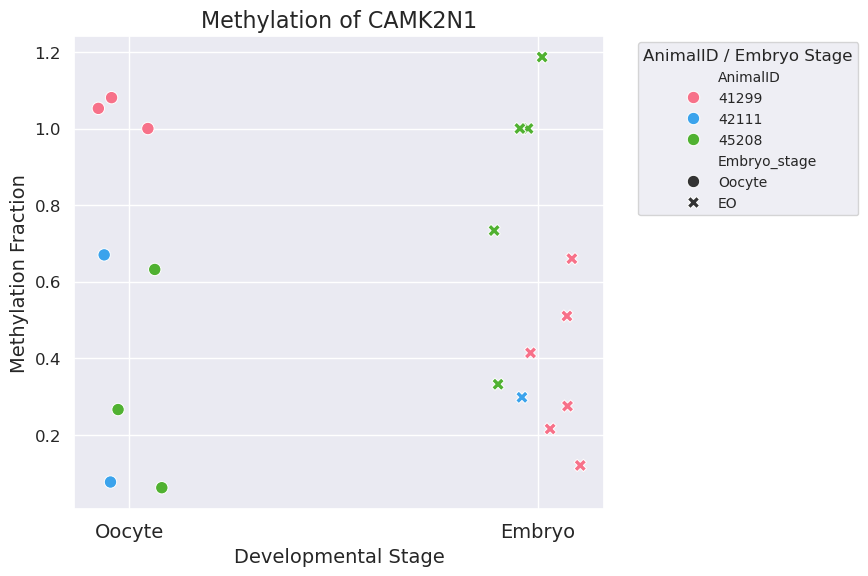

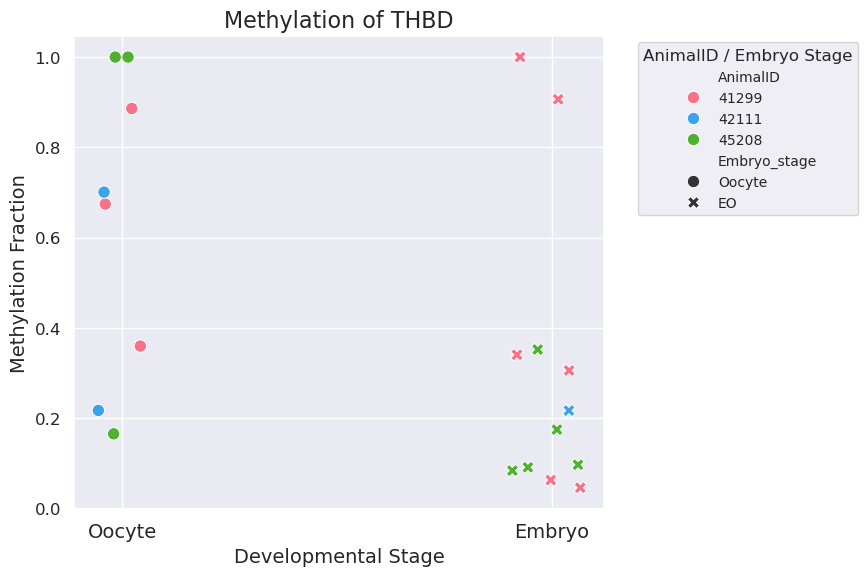

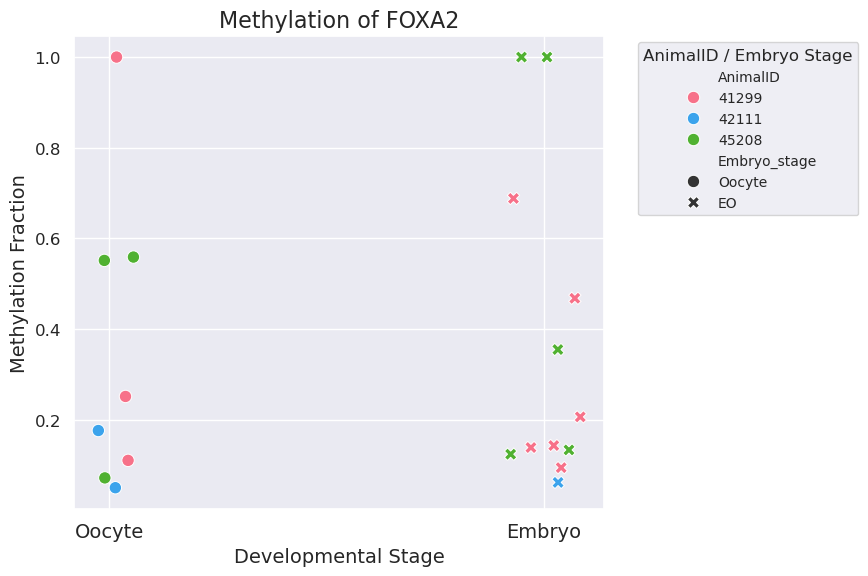

...

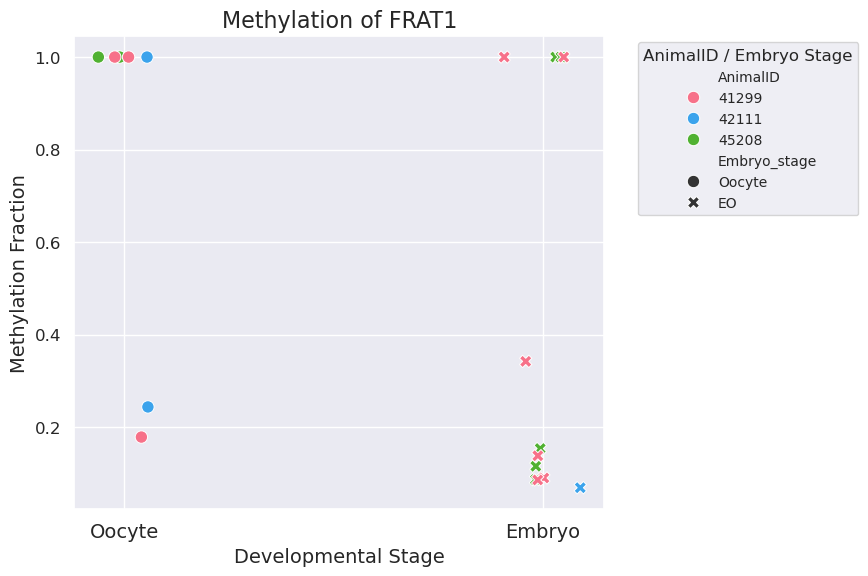

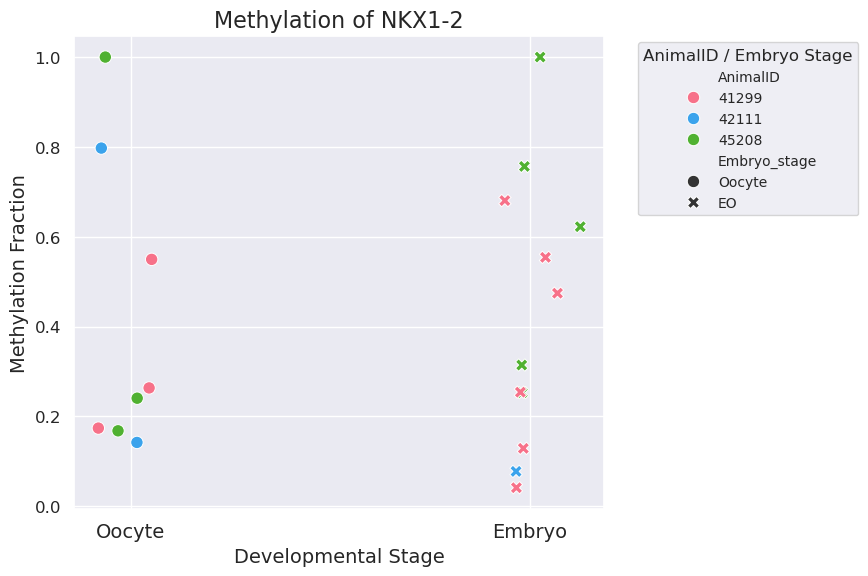

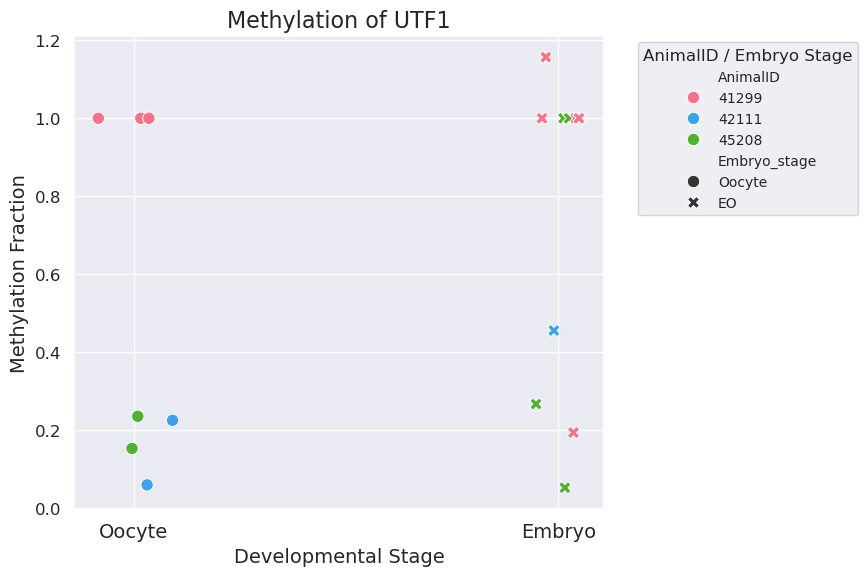

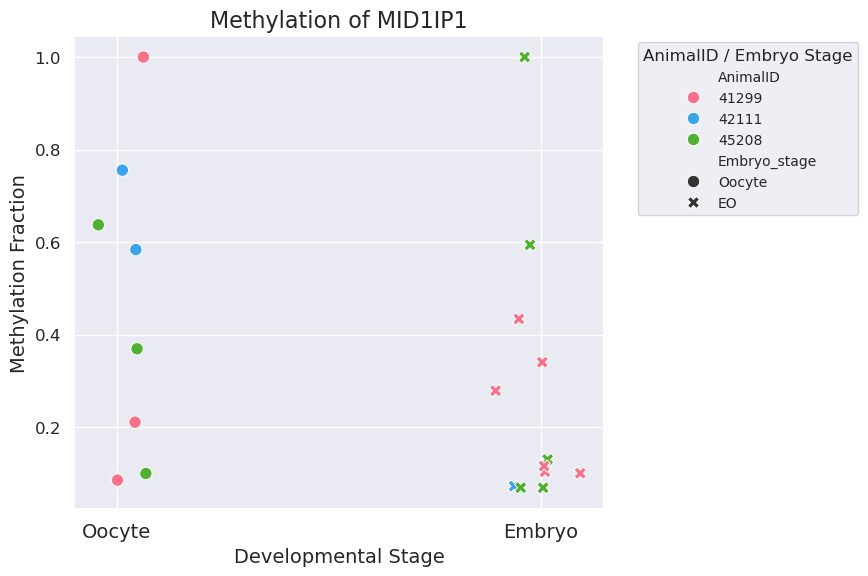

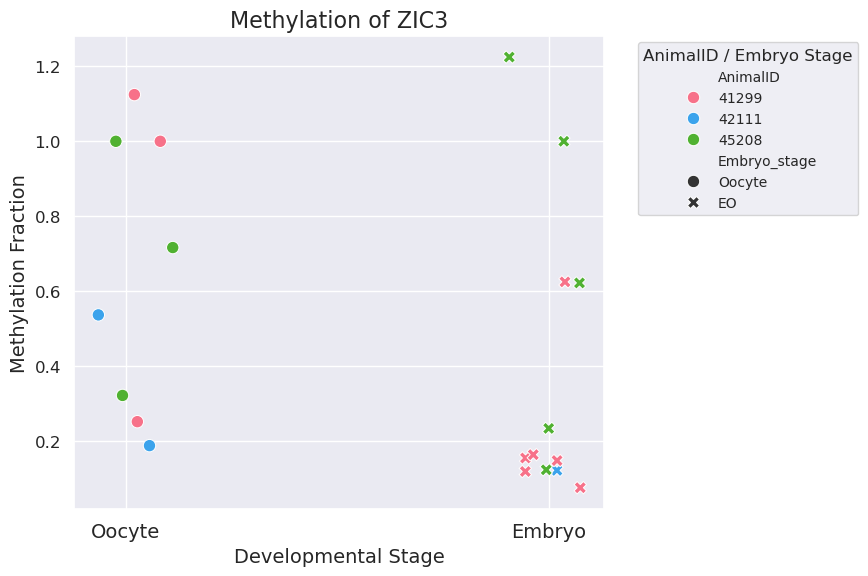

In [116]:
# add embryo type and gene name 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Create output folder
os.makedirs("gene_methylation_plots", exist_ok=True)

# Merge gene_id ↔ genename
gene_name_map = genes_df.dropna(subset=["genename"]).set_index("gene_id")["genename"].to_dict()

# Get shared AnimalIDs
common_animal_ids = np.intersect1d(adataoocyte.obs['AnimalID'], adataembryo.obs['AnimalID'])
adataoocyte_shared = adataoocyte[adataoocyte.obs['AnimalID'].isin(common_animal_ids)].copy()
adataembryo_shared = adataembryo[adataembryo.obs['AnimalID'].isin(common_animal_ids)].copy()

# Preload metadata
animal_ids_oocyte = adataoocyte_shared.obs['AnimalID'].tolist()
animal_ids_embryo = adataembryo_shared.obs['AnimalID'].tolist()
embryo_types = adataembryo_shared.obs['Type'].tolist()
oocyte_types = ['Oocyte'] * adataoocyte_shared.n_obs

# Loop over genes
for gene in genes_df['gene_id'].dropna().unique():
    try:
        gene_idx_oocyte = np.where(adataoocyte_shared.var['gene_id'] == gene)[0][0]
        gene_idx_embryo = np.where(adataembryo_shared.var['gene_id'] == gene)[0][0]
    except IndexError:
        print(f"Gene '{gene}' not found in both datasets. Skipping.")
        continue

    # Get gene name (fallback to gene_id)
    gene_name = gene_name_map.get(gene, gene)

    # Extract methylation
    gene_meth_oocyte = adataoocyte_shared.layers['methylation_fraction'][:, gene_idx_oocyte]
    gene_meth_embryo = adataembryo_shared.layers['methylation_fraction'][:, gene_idx_embryo]
    gene_meth_oocyte = gene_meth_oocyte.toarray().flatten() if hasattr(gene_meth_oocyte, 'toarray') else np.ravel(gene_meth_oocyte)
    gene_meth_embryo = gene_meth_embryo.toarray().flatten() if hasattr(gene_meth_embryo, 'toarray') else np.ravel(gene_meth_embryo)

    # Build DataFrame
    df_gene = pd.DataFrame({
        'Sample': list(adataoocyte_shared.obs_names) + list(adataembryo_shared.obs_names),
        'Methylation': np.concatenate([gene_meth_oocyte, gene_meth_embryo]),
        'AnimalID': animal_ids_oocyte + animal_ids_embryo,
        'Stage': ['Oocyte'] * len(gene_meth_oocyte) + ['Embryo'] * len(gene_meth_embryo),
        'Embryo_stage': oocyte_types + embryo_types
    })

    # Assign color
    unique_animals = df_gene['AnimalID'].unique()
    animal_colors = dict(zip(unique_animals, sns.color_palette('husl', len(unique_animals))))
    df_gene['Color'] = df_gene['AnimalID'].map(animal_colors)

    # Add jitter to x-axis
    stage_map = {'Oocyte': 0, 'Embryo': 1}
    df_gene['x'] = df_gene['Stage'].map(stage_map) + np.random.normal(0, 0.05, size=len(df_gene))

    # Plot
    plt.figure(figsize=(9, 6))
    sns.scatterplot(
        data=df_gene,
        x='x', y='Methylation',
        hue='AnimalID',
        style='Embryo_stage',
        palette=animal_colors,
        s=80
    )

    # Format
    plt.xticks([0, 1], ['Oocyte', 'Embryo'], fontsize=14)
    plt.yticks(fontsize=12)
    plt.xlabel("Developmental Stage", fontsize=14)
    plt.ylabel("Methylation Fraction", fontsize=14)
    plt.title(f"Methylation of {gene_name}", fontsize=16)
    plt.legend(title='AnimalID / Embryo Stage', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10, title_fontsize=12)
    plt.tight_layout()

    # Save
    filename = str(gene_name).replace(" ", "_").replace("/", "_")
    plt.savefig(f"embryo-only/gene_methylation_plots/{filename}_methylation_genename.png", dpi=300)
    plt.show()


In [117]:
# create methylation delta summary table 

import pandas as pd
import numpy as np
import os

# Prepare output folder
os.makedirs("embryo-only/summary_tables", exist_ok=True)

# Gene name map
gene_name_map = genes_df.dropna(subset=["genename"]).set_index("gene_id")["genename"].to_dict()

# Get shared animals
common_animal_ids = np.intersect1d(adataoocyte.obs['AnimalID'], adataembryo.obs['AnimalID'])
adataoocyte_shared = adataoocyte[adataoocyte.obs['AnimalID'].isin(common_animal_ids)].copy()
adataembryo_shared = adataembryo[adataembryo.obs['AnimalID'].isin(common_animal_ids)].copy()

# Initialize records
delta_records = []

for gene in genes_df['gene_id'].dropna().unique():
    try:
        idx_oocyte = np.where(adataoocyte_shared.var['gene_id'] == gene)[0][0]
        idx_embryo = np.where(adataembryo_shared.var['gene_id'] == gene)[0][0]
    except IndexError:
        continue

    meth_oocyte = adataoocyte_shared.layers['methylation_fraction'][:, idx_oocyte]
    meth_embryo = adataembryo_shared.layers['methylation_fraction'][:, idx_embryo]
    meth_oocyte = meth_oocyte.toarray().flatten() if hasattr(meth_oocyte, 'toarray') else np.ravel(meth_oocyte)
    meth_embryo = meth_embryo.toarray().flatten() if hasattr(meth_embryo, 'toarray') else np.ravel(meth_embryo)

    df = pd.DataFrame({
        'Sample': list(adataoocyte_shared.obs_names) + list(adataembryo_shared.obs_names),
        'Methylation': np.concatenate([meth_oocyte, meth_embryo]),
        'AnimalID': list(adataoocyte_shared.obs['AnimalID']) + list(adataembryo_shared.obs['AnimalID']),
        'Stage': ['Oocyte'] * len(meth_oocyte) + ['Embryo'] * len(meth_embryo),
        'Embryo_stage': ['Oocyte'] * len(meth_oocyte) + list(adataembryo_shared.obs['Type'])
    })

    for aid in df['AnimalID'].unique():
        sub = df[df['AnimalID'] == aid]
        if 'Oocyte' not in sub['Stage'].values or 'Embryo' not in sub['Stage'].values:
            continue

        o_mean = sub[sub['Stage'] == 'Oocyte']['Methylation'].mean()
        e_mean = sub[sub['Stage'] == 'Embryo']['Methylation'].mean()
        delta = e_mean - o_mean
        eo_count = sum(sub['Embryo_stage'] == 'EO')
        bl_count = sum(sub['Embryo_stage'] == 'BL')

        delta_records.append({
            'gene_id': gene,
            'genename': gene_name_map.get(gene, ''),
            'AnimalID': aid,
            'Oocyte_mean': o_mean,
            'Embryo_mean': e_mean,
            'Delta': delta,
            'Embryo_EO_n': eo_count,
            'Embryo_BL_n': bl_count
        })

# Create DataFrame and save
delta_df = pd.DataFrame(delta_records)
delta_df.sort_values(by=['gene_id', 'AnimalID'], inplace=True)
delta_df.to_csv("embryo-only/summary_tables/gene_methylation_deltas_per_animal.csv", index=False)

# Also make gene-level average delta for plotting or heatmap
avg_df = delta_df.groupby(['gene_id', 'genename']).agg({
    'Delta': 'mean',
    'Oocyte_mean': 'mean',
    'Embryo_mean': 'mean'
}).reset_index().sort_values(by='Delta', ascending=False)

avg_df.to_csv("embryo-only/summary_tables/gene_methylation_average_delta.csv", index=False)


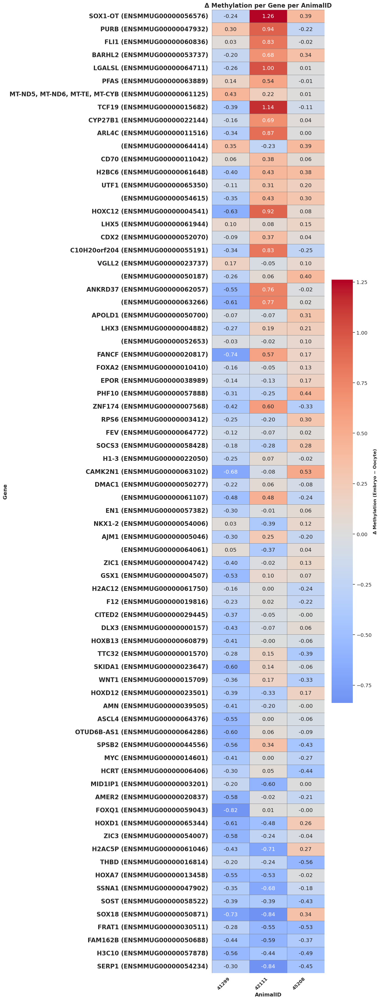

In [118]:
# generate the heatmap

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os

# Load delta methylation data
delta_df = pd.read_csv("embryo-only/summary_tables/gene_methylation_deltas_per_animal.csv")

# Use gene name if available
delta_df['label'] = delta_df['genename'].fillna('') + ' (' + delta_df['gene_id'] + ')'
delta_df['label'] = delta_df['label'].str.replace(' ()', '', regex=False)

# Pivot for heatmap
heatmap_data = delta_df.pivot(index="label", columns="AnimalID", values="Delta")
heatmap_data['avg_delta'] = heatmap_data.mean(axis=1)
heatmap_data.sort_values('avg_delta', ascending=False, inplace=True)
heatmap_data.drop(columns='avg_delta', inplace=True)

# Plot heatmap with larger bold fonts
plt.figure(figsize=(14, 0.5 * heatmap_data.shape[0]))
sns.set(font_scale=1.2)  # Scale font globally

ax = sns.heatmap(
    heatmap_data,
    cmap="coolwarm",
    center=0,
    linewidths=0.5,
    linecolor='gray',
    cbar_kws={"label": "Δ Methylation (Embryo − Oocyte)"},
    annot=True,
    fmt=".2f"
)

# Make everything bold and larger
ax.set_title("Δ Methylation per Gene per AnimalID", fontsize=16, fontweight='bold')
ax.set_xlabel("AnimalID", fontsize=14, fontweight='bold')
ax.set_ylabel("Gene", fontsize=14, fontweight='bold')

# Rotate and bold tick labels
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', fontsize=12, fontweight='bold')
ax.set_yticklabels(ax.get_yticklabels(), fontsize=16, fontweight='bold')

# Bold colorbar label
colorbar = ax.collections[0].colorbar
colorbar.ax.yaxis.label.set_fontsize(12)
colorbar.ax.yaxis.label.set_fontweight('bold')

plt.tight_layout()

# Save figure
os.makedirs("embryo-only/heatmaps", exist_ok=True)
plt.savefig("embryo-only/heatmaps/delta_methylation_heatmap_bold.png", dpi=300)
plt.show()


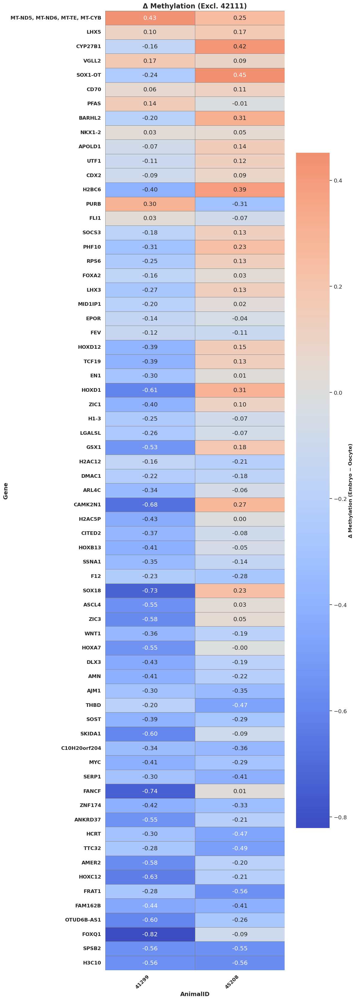

In [119]:
# ilter Out AnimalID 42111 and Sort Genes by Average Δ Methylation (Largest to Smallest)

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os

# Load the full delta table
delta_df = pd.read_csv("summary_tables/gene_methylation_deltas_per_animal.csv")

# Exclude AnimalID 42111
delta_df = delta_df[delta_df['AnimalID'] != 42111]

# Remove genes without genename
delta_df = delta_df.dropna(subset=['genename'])

# Use genename as label
delta_df['label'] = delta_df['genename']

# Pivot table: genes × AnimalID
heatmap_data = delta_df.pivot(index="label", columns="AnimalID", values="Delta")

# Sort genes by average delta across remaining animals
heatmap_data['avg_delta'] = heatmap_data.mean(axis=1)
heatmap_data.sort_values('avg_delta', ascending=False, inplace=True)
heatmap_data.drop(columns='avg_delta', inplace=True)

# Plot
plt.figure(figsize=(12, 0.5 * heatmap_data.shape[0]))
sns.set(font_scale=1.2)

ax = sns.heatmap(
    heatmap_data,
    cmap="coolwarm",
    center=0,
    linewidths=0.5,
    linecolor='gray',
    cbar_kws={"label": "Δ Methylation (Embryo − Oocyte)"},
    annot=True,
    fmt=".2f"
)

# Format fonts
ax.set_title("Δ Methylation (Excl. 42111)", fontsize=16, fontweight='bold')
ax.set_xlabel("AnimalID", fontsize=14, fontweight='bold')
ax.set_ylabel("Gene", fontsize=14, fontweight='bold')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', fontsize=12, fontweight='bold')
ax.set_yticklabels(ax.get_yticklabels(), fontsize=12, fontweight='bold')

colorbar = ax.collections[0].colorbar
colorbar.ax.yaxis.label.set_fontsize(12)
colorbar.ax.yaxis.label.set_fontweight('bold')

plt.tight_layout()

# Save output
#os.makedirs("embryo-only/heatmaps", exist_ok=True)
plt.savefig("embryo-only/heatmaps/delta_methylation_heatmap_no_42111_sorted.png", dpi=300)
plt.show()



/tmp/ipykernel_3778582/589677339.py:64: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(label_texts, fontsize=11, fontweight='bold')


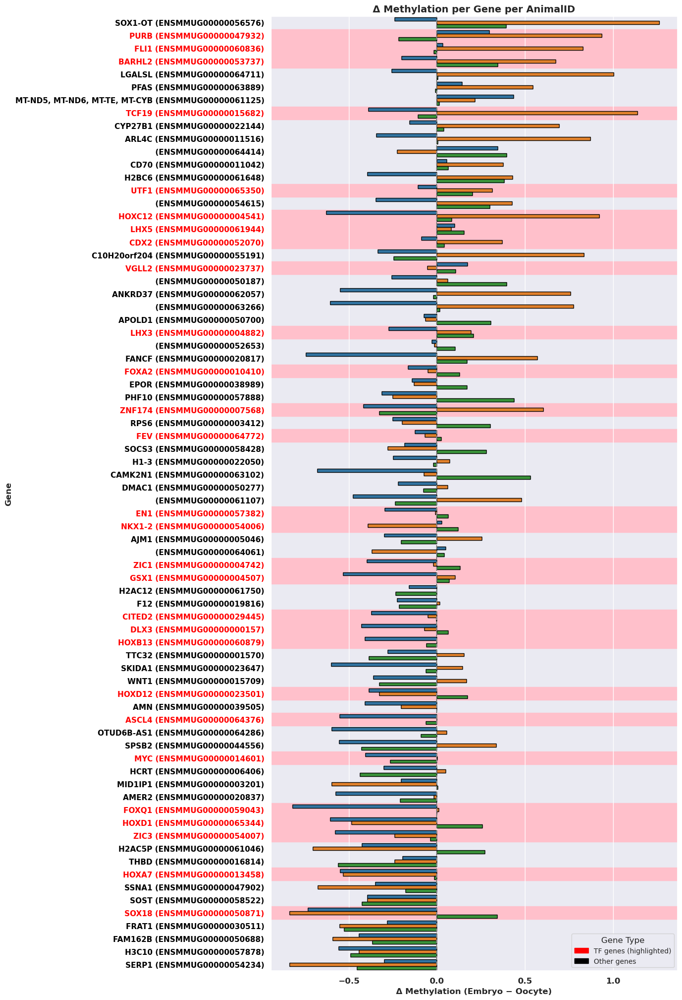

In [120]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import os

# ── Define transcription factors (TFs) ──
highlight_tfs = [
    'BARHL2', 'FOXA2', 'SOX18', 'HOXC12', 'ASCL4', 'LHX5', 'EN1', 
    'HOXD12', 'HOXD1', 'FEV', 'LHX3', 'DLX3', 'HOXB13', 'GSX1', 
    'CDX2', 'ZIC1', 'ZNF174', 'PURB', 'HOXA7', 'VGLL2', 'CITED2', 
    'TCF19', 'FOXQ1', 'MYC', 'NKX1-2', 'FLI1', 'UTF1', 'ZIC3'
]

# ── Load data ──
delta_df = pd.read_csv("embryo-only/summary_tables/gene_methylation_deltas_per_animal.csv")

# Mark TFs
delta_df['is_tf'] = delta_df['genename'].isin(highlight_tfs)

# Combine gene name and ID
delta_df['label'] = delta_df['genename'].fillna('') + ' (' + delta_df['gene_id'] + ')'
delta_df['label'] = delta_df['label'].str.replace(' ()', '', regex=False)

# Sort by average delta methylation
avg_delta = delta_df.groupby('label')['Delta'].mean().reset_index(name='avg_delta')
delta_df = delta_df.merge(avg_delta, on='label')
delta_df = delta_df.sort_values('avg_delta', ascending=False)

# ── Step 4: Plot grouped barplot ──
plt.figure(figsize=(14, 0.3 * len(delta_df['genename'].unique())))

# Define color palette
highlight_color = 'red'  # red for TFs
default_color = 'black'    # gray for others

# Assign colors row-wise
colors = delta_df['is_tf'].map({True: highlight_color, False: default_color})

# Create barplot
ax = sns.barplot(
    data=delta_df,
    x='Delta',
    y='label',
    hue='AnimalID',
    dodge=True,
    palette='tab10',  # distinguish animals by color
    edgecolor='black'
)

# Draw a vertical line at x=0
plt.axvline(0, linestyle='--', color='gray')

# Set title and axis labels
plt.title("Δ Methylation per Gene per AnimalID", fontsize=14, fontweight='bold')
plt.xlabel("Δ Methylation (Embryo − Oocyte)", fontsize=12, fontweight='bold')
plt.ylabel("Gene", fontsize=12, fontweight='bold')
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=13)  # We'll customize TFs below
plt.legend(title="AnimalID", title_fontsize=12, fontsize=11, loc='best')

# Y-axis label font settings: red for TFs
label_texts = [tick.get_text() for tick in ax.get_yticklabels()]
ax.set_yticklabels(label_texts, fontsize=11, fontweight='bold')

for tick, label in zip(ax.get_yticklabels(), label_texts):
    if label in delta_df.loc[delta_df['is_tf'], 'label'].values:
        tick.set_color(highlight_color)
    else:
        tick.set_color(default_color)
from matplotlib.patches import Rectangle

for ytick, label in zip(ax.get_yticklabels(), delta_df['label'].unique()):
    if label in delta_df.loc[delta_df['is_tf'], 'label'].unique():
        ytick_index = ax.get_yticklabels().index(ytick)
        ax.add_patch(Rectangle(
            (ax.get_xlim()[0], ytick_index - 0.5),
            width=ax.get_xlim()[1] - ax.get_xlim()[0],
            height=1,
            color='pink',
            zorder=0
        ))

# Add custom legend for TFs
tf_patch = mpatches.Patch(color=highlight_color, label='TF genes (highlighted)')
other_patch = mpatches.Patch(color=default_color, label='Other genes')
plt.legend(handles=[tf_patch, other_patch], title="Gene Type", title_fontsize=12, fontsize=10, loc='lower right')

plt.tight_layout()

# # ── Save plot ──
os.makedirs("embryo-only/barplots", exist_ok=True)
plt.savefig("embryo-only/barplots/delta_methylation_perAnimal_barplot_highlightTFs_redlabel.png", dpi=300)
plt.show()


/tmp/ipykernel_1998154/3584029885.py:92: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(label_texts, fontsize=11, fontweight='bold')


TypeError: cannot unpack non-iterable Patch object

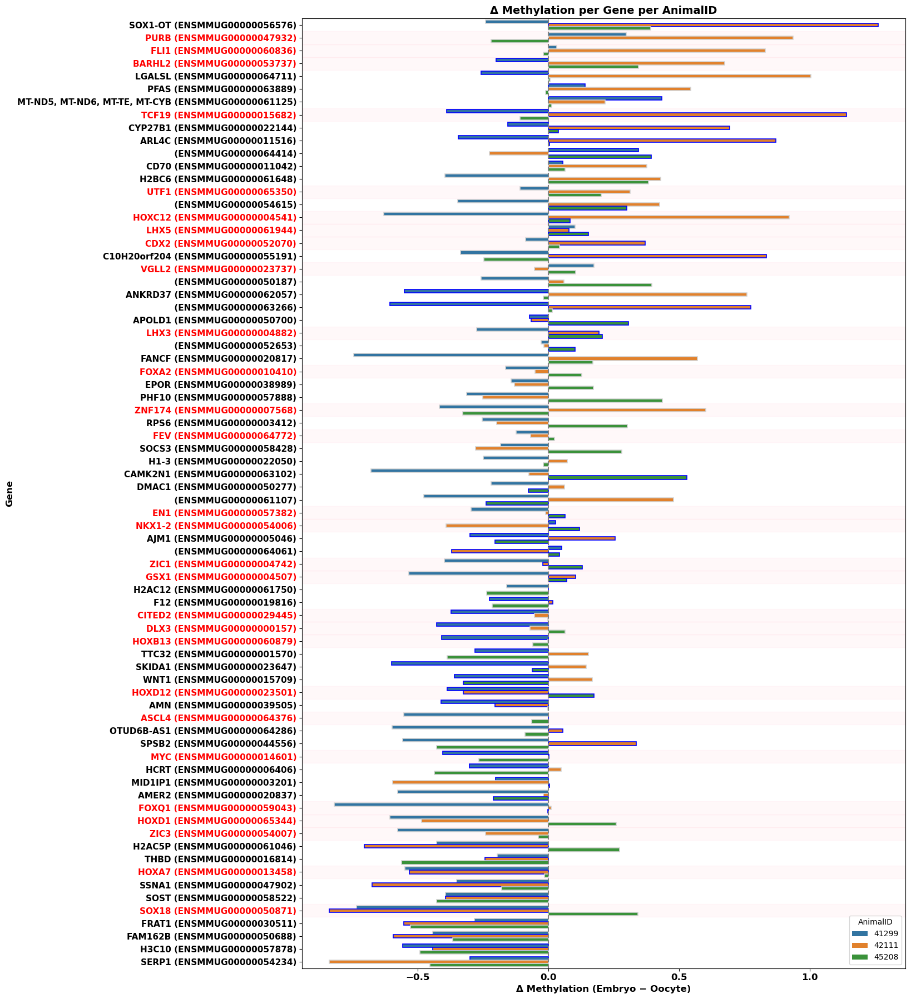

In [15]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.patches import Rectangle
from scipy.stats import ttest_1samp
from statsmodels.stats.multitest import multipletests
import os

# ── Define transcription factors (TFs) ──
highlight_tfs = [
    'BARHL2', 'FOXA2', 'SOX18', 'HOXC12', 'ASCL4', 'LHX5', 'EN1', 
    'HOXD12', 'HOXD1', 'FEV', 'LHX3', 'DLX3', 'HOXB13', 'GSX1', 
    'CDX2', 'ZIC1', 'ZNF174', 'PURB', 'HOXA7', 'VGLL2', 'CITED2', 
    'TCF19', 'FOXQ1', 'MYC', 'NKX1-2', 'FLI1', 'UTF1', 'ZIC3'
]

# ── Load data ──
delta_df = pd.read_csv("embryo-only/summary_tables/gene_methylation_deltas_per_animal.csv")

# Combine gene name and ID
delta_df['label'] = delta_df['genename'].fillna('') + ' (' + delta_df['gene_id'] + ')'
delta_df['label'] = delta_df['label'].str.replace(' ()', '', regex=False)

# ── Statistical test per gene ──
gene_stats = []
for label, group in delta_df.groupby('label'):
    if group['Delta'].nunique() > 1:
        t_stat, pval = ttest_1samp(group['Delta'], 0)
    else:
        pval = 1.0
    gene_stats.append({
        'label': label,
        'avg_delta': group['Delta'].mean(),
        'pval': pval
    })

stats_df = pd.DataFrame(gene_stats)
stats_df['fdr'] = multipletests(stats_df['pval'], method='fdr_bh')[1]
stats_df['significant'] = (stats_df['fdr'] < 0.05) & (stats_df['avg_delta'].abs() > 0.1)

# Merge back into delta_df
delta_df = delta_df.merge(stats_df[['label', 'avg_delta', 'pval', 'fdr', 'significant']], on='label', how='left')
delta_df['is_tf'] = delta_df['genename'].isin(highlight_tfs)

# Sort by avg_delta
delta_df = delta_df.sort_values('avg_delta', ascending=False)

# ── Assign edgecolor based on TF and significance ──
def assign_color(row):
    if row['significant'] and row['is_tf']:
        return 'red'
    elif row['is_tf']:
        return 'blue'
    elif row['significant']:
        return 'orange'
    else:
        return 'lightgray'

delta_df['edgecolor'] = delta_df.apply(assign_color, axis=1)

# ── Plot grouped barplot ──
plt.figure(figsize=(14, 0.3 * len(delta_df['label'].unique())))

ax = sns.barplot(
    data=delta_df,
    x='Delta',
    y='label',
    hue='AnimalID',
    dodge=True,
    palette='tab10'
)

# Manually set edge color
bars = ax.patches
for bar, (_, row) in zip(bars, delta_df.iterrows()):
    bar.set_edgecolor(row['edgecolor'])
    bar.set_linewidth(1.2)

# Draw a vertical line at x=0
plt.axvline(0, linestyle='--', color='gray')

# Set title and axis labels
plt.title("Δ Methylation per Gene per AnimalID", fontsize=14, fontweight='bold')
plt.xlabel("Δ Methylation (Embryo − Oocyte)", fontsize=12, fontweight='bold')
plt.ylabel("Gene", fontsize=12, fontweight='bold')
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=13)

# Color y-axis labels: red if TF
label_texts = [tick.get_text() for tick in ax.get_yticklabels()]
ax.set_yticklabels(label_texts, fontsize=11, fontweight='bold')
for tick, label in zip(ax.get_yticklabels(), label_texts):
    if label in delta_df.loc[delta_df['is_tf'], 'label'].values:
        tick.set_color('red')
    else:
        tick.set_color('black')

# Optional background shading for TFs
for ytick, label in zip(ax.get_yticklabels(), delta_df['label'].unique()):
    if label in delta_df.loc[delta_df['is_tf'], 'label'].unique():
        ytick_index = ax.get_yticklabels().index(ytick)
        ax.add_patch(Rectangle(
            (ax.get_xlim()[0], ytick_index - 0.5),
            width=ax.get_xlim()[1] - ax.get_xlim()[0],
            height=1,
            color='pink',
            alpha=0.1,
            zorder=0
        ))

# # ── Custom legend ──
# legend_patches = [
#     mpatches.Patch(color='red', label='Significant TF'),
#     mpatches.Patch(color='blue', label='TF (not significant)'),
#     mpatches.Patch(color='orange', label='Significant gene'),
#     mpatches.Patch(color='lightgray', label='Other gene')
# ]
# plt.legend(handles=legend_patches, title="Gene Type", title_fontsize=12, fontsize=10, loc='lower right')

# Get AnimalID legend handles and labels from Seaborn
handles, labels = ax.get_legend_handles_labels()
animal_legend = list(zip(handles, labels))

# Create gene type legend manually
gene_type_legend = [
    mpatches.Patch(color='red', label='Significant TF'),
    mpatches.Patch(color='blue', label='TF (not significant)'),
    mpatches.Patch(color='orange', label='Significant gene'),
    mpatches.Patch(color='lightgray', label='Other gene')
]

# Combine both legends
combined_legend = animal_legend + gene_type_legend
combined_handles, combined_labels = zip(*[(h, l) for h, l in combined_legend])

# Plot the combined legend
plt.legend(combined_handles, combined_labels, title="AnimalID & Gene Type", title_fontsize=12, fontsize=10, loc='lower center', bbox_to_anchor=(0.5, -0.05), ncol=2)

plt.tight_layout()

# ── Save plot ──
os.makedirs("embryo-only/barplots", exist_ok=True)
plt.savefig("embryo-only/barplots/delta_methylation_perAnimal_barplot_highlightTFs_withStat.png", dpi=300)
plt.show()


/tmp/ipykernel_1811676/379158744.py:67: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


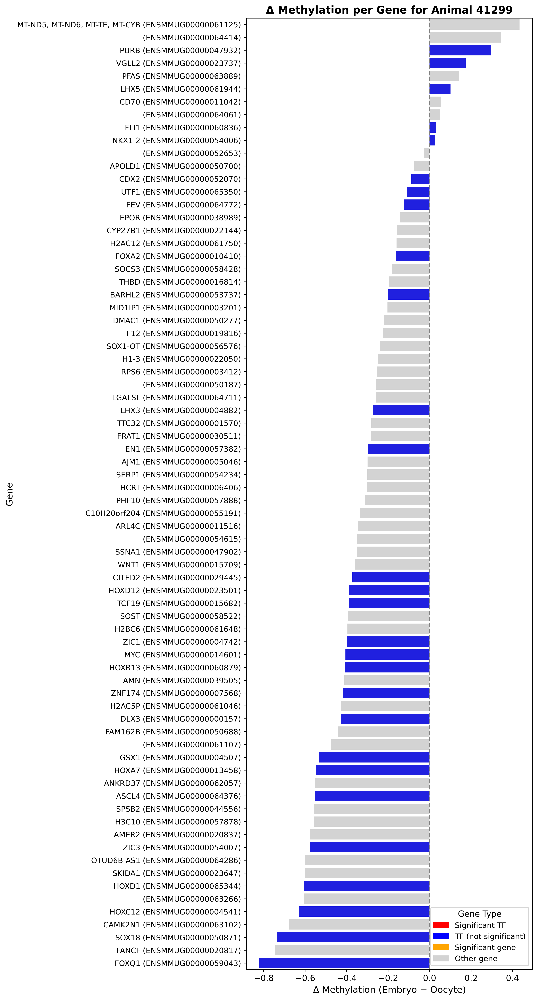

/tmp/ipykernel_1811676/379158744.py:67: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


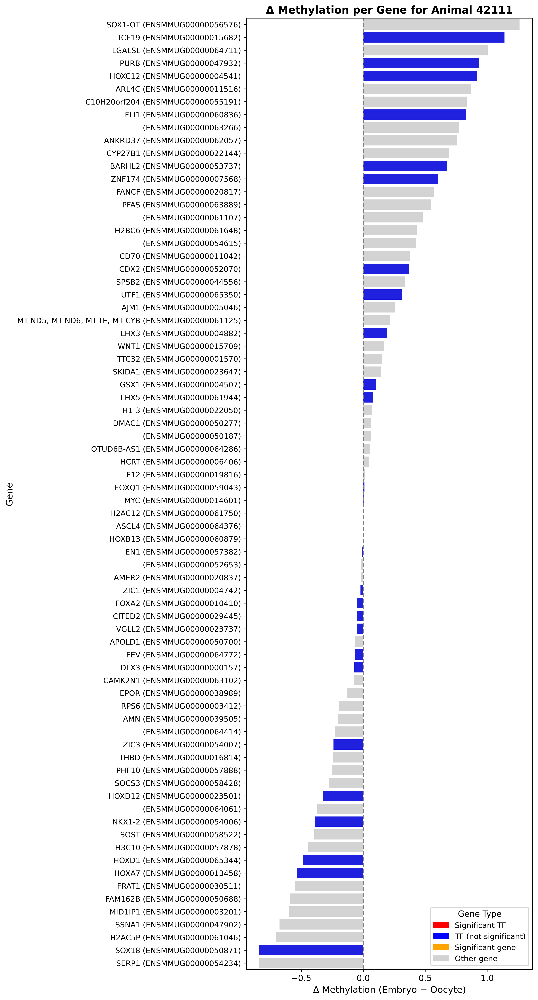

/tmp/ipykernel_1811676/379158744.py:67: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


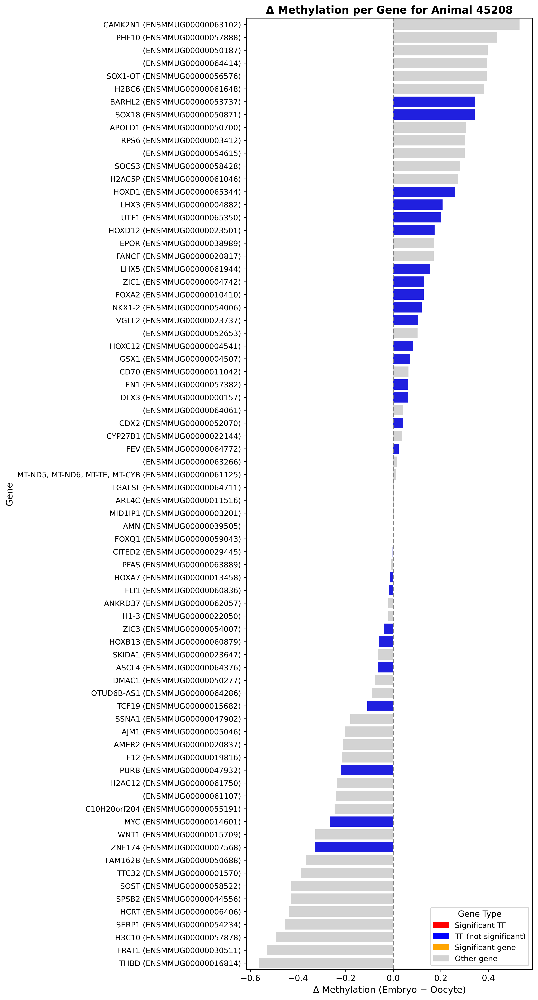

In [2]:
# per animal plot + statt pval
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patches as mpatches
import os
from scipy.stats import ttest_1samp
from statsmodels.stats.multitest import multipletests
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
matplotlib.rcParams['figure.dpi'] = 300
matplotlib.rcParams['savefig.transparent'] = True
matplotlib.rcParams['path.simplify'] = False  # keep exact vectors
# ── Define TF list ──
highlight_tfs = [
    'BARHL2', 'FOXA2', 'SOX18', 'HOXC12', 'ASCL4', 'LHX5', 'EN1', 
    'HOXD12', 'HOXD1', 'FEV', 'LHX3', 'DLX3', 'HOXB13', 'GSX1', 
    'CDX2', 'ZIC1', 'ZNF174', 'PURB', 'HOXA7', 'VGLL2', 'CITED2', 
    'TCF19', 'FOXQ1', 'MYC', 'NKX1-2', 'FLI1', 'UTF1', 'ZIC3'
]

# ── Load Δ methylation per-animal data ──
delta_df = pd.read_csv("embryo-only/summary_tables/gene_methylation_deltas_per_animal.csv")

# Create label
delta_df['label'] = delta_df['genename'].fillna('') + ' (' + delta_df['gene_id'] + ')'
delta_df['label'] = delta_df['label'].str.replace(' ()', '', regex=False)
delta_df['is_tf'] = delta_df['genename'].isin(highlight_tfs)

# ── T-test per gene ──
stats = []
for label, group in delta_df.groupby('label'):
    if group['Delta'].nunique() > 1:
        _, pval = ttest_1samp(group['Delta'], 0)
    else:
        pval = 1.0
    stats.append({'label': label, 'avg_delta': group['Delta'].mean(), 'pval': pval})
stats_df = pd.DataFrame(stats)
stats_df['fdr'] = multipletests(stats_df['pval'], method='fdr_bh')[1]
stats_df['significant'] = (stats_df['fdr'] < 0.05) & (stats_df['avg_delta'].abs() > 0.1)

# Merge back
delta_df = delta_df.merge(stats_df[['label', 'significant']], on='label')

# ── Assign color per gene per animal ──
def assign_color(row):
    if row['significant'] and row['is_tf']:
        return 'red'
    elif row['is_tf']:
        return 'blue'
    elif row['significant']:
        return 'orange'
    else:
        return 'lightgray'

delta_df['color'] = delta_df.apply(assign_color, axis=1)

# ── Output directory ──
os.makedirs("embryo-only/barplots/per_animal", exist_ok=True)

# ── Plot per animal ──
for animal_id, group in delta_df.groupby("AnimalID"):
    group_sorted = group.sort_values("Delta", ascending=False)

    plt.figure(figsize=(10, 0.25 * len(group_sorted)))
    sns.barplot(
        data=group_sorted,
        x="Delta",
        y="label",
        palette=group_sorted.set_index('label')['color'].to_dict()
    )

    plt.axvline(0, linestyle='--', color='gray')
    plt.title(f"Δ Methylation per Gene for Animal {animal_id}", fontsize=14, fontweight='bold')
    plt.xlabel("Δ Methylation (Embryo − Oocyte)", fontsize=12)
    plt.ylabel("Gene", fontsize=12)
    plt.xticks(fontsize=11)
    plt.yticks(fontsize=10)

    # Legend
    legend_patches = [
        mpatches.Patch(color='red', label='Significant TF'),
        mpatches.Patch(color='blue', label='TF (not significant)'),
        mpatches.Patch(color='orange', label='Significant gene'),
        mpatches.Patch(color='lightgray', label='Other gene')
    ]
    plt.legend(handles=legend_patches, title="Gene Type", title_fontsize=11, fontsize=10, loc='lower right')

    plt.tight_layout()
   # plt.savefig(f"embryo-only/barplots/per_animal/animal_{animal_id}_delta_methylation.png", dpi=300)
    plt.savefig(f"embryo-only/barplots/per_animal/animal_{animal_id}_delta_methylation_panela-sf6.pdf", dpi=300)
    plt.show()


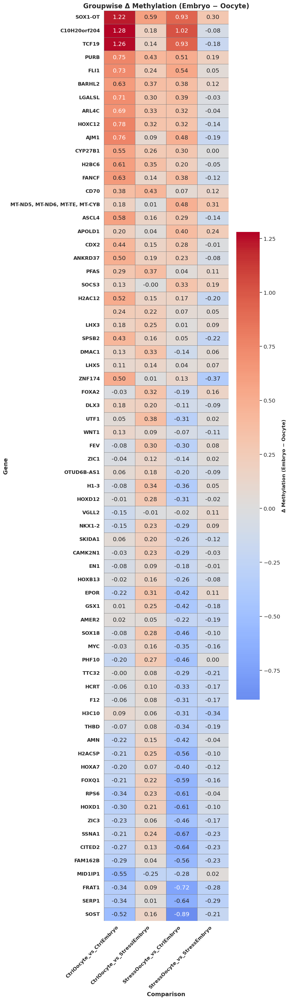

In [24]:
# Groupwise Methylation Δ Heatmap (Oocyte ↔ Embryo)

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os

# ── Load gene list ──
genes_df = pd.read_csv("../../alloocytes/results-pooled/mCG_genenames_coords_withlifted.csv", sep=",")
genes_df.columns = ["gene_id", "chr", "start", "end", "genename"]
gene_name_map = genes_df.dropna(subset=["genename"]).set_index("gene_id")["genename"].to_dict()

# ── Output folder ──
os.makedirs("embryo-only/summary_tables", exist_ok=True)
os.makedirs("embryo-only/heatmaps", exist_ok=True)

# ── Define sample groups ──
group_definitions = {
    "CtrlOocyte_vs_CtrlEmbryo": {
        "oocyte_mask": (adataoocyte.obs['Group'] == "Control"),
        "embryo_mask": (adataembryo.obs['Group'] == "Control"),
    },
    "CtrlOocyte_vs_StresslEmbryo": {
        "oocyte_mask": (adataoocyte.obs['Group'] == "Control"),
        "embryo_mask": (adataembryo.obs['Group'] == "Stressed"),
    },
    "StressOocyte_vs_StressEmbryo": {
        "oocyte_mask": (adataoocyte.obs['Group'] == "Stressed"),
        "embryo_mask": (adataembryo.obs['Group'] == "Stressed"),
    },
    "StressOocyte_vs_CtrlEmbryo": {
        "oocyte_mask": (adataoocyte.obs['Group'] == "Stressed"),
        "embryo_mask": (adataembryo.obs['Group'] == "Control"),
    },
}

# ── Loop through genes and calculate deltas ──
delta_records = []

for gene_id in genes_df["gene_id"].dropna().unique():
    try:
        idx_oocyte = np.where(adataoocyte.var['gene_id'] == gene_id)[0][0]
        idx_embryo = np.where(adataembryo.var['gene_id'] == gene_id)[0][0]
    except IndexError:
        continue

    for group_name, masks in group_definitions.items():
        o_mask = masks["oocyte_mask"]
        e_mask = masks["embryo_mask"]

        meth_oocyte = adataoocyte[o_mask].layers['methylation_fraction'][:, idx_oocyte]
        meth_embryo = adataembryo[e_mask].layers['methylation_fraction'][:, idx_embryo]

        meth_oocyte = meth_oocyte.toarray().flatten() if hasattr(meth_oocyte, 'toarray') else np.ravel(meth_oocyte)
        meth_embryo = meth_embryo.toarray().flatten() if hasattr(meth_embryo, 'toarray') else np.ravel(meth_embryo)

        delta = np.nanmean(meth_embryo) - np.nanmean(meth_oocyte)

        delta_records.append({
            "gene_id": gene_id,
            "genename": gene_name_map.get(gene_id, ""),
            "Comparison": group_name,
            "Oocyte_mean": np.nanmean(meth_oocyte),
            "Embryo_mean": np.nanmean(meth_embryo),
            "Delta": delta,
        })

# ── Save Δ table ──
df_delta = pd.DataFrame(delta_records)
df_delta.to_csv("summary_tables/groupwise_methylation_deltas.csv", index=False)

# ── Pivot and sort for heatmap ──
#df_heatmap = df_delta.dropna(subset=["genename"]).pivot(index="genename", columns="Comparison", values="Delta")
df_heatmap = df_delta.dropna(subset=["genename"]).pivot_table(
    index="genename",
    columns="Comparison",
    values="Delta",
    aggfunc="mean"  # or "median" depending on your needs
)


df_heatmap["avg_delta"] = df_heatmap.mean(axis=1)
df_heatmap = df_heatmap.sort_values("avg_delta", ascending=False).drop(columns="avg_delta")

# ── Plot heatmap ──
plt.figure(figsize=(10, 0.5 * len(df_heatmap)))
sns.set(font_scale=1.2)

ax = sns.heatmap(
    df_heatmap,
    cmap="coolwarm",
    center=0,
    linewidths=0.5,
    linecolor='gray',
    cbar_kws={"label": "Δ Methylation (Embryo − Oocyte)"},
    annot=True,
    fmt=".2f"
)

ax.set_title("Groupwise Δ Methylation (Embryo − Oocyte)", fontsize=16, fontweight='bold')
ax.set_xlabel("Comparison", fontsize=14, fontweight='bold')
ax.set_ylabel("Gene", fontsize=14, fontweight='bold')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', fontsize=12, fontweight='bold')
ax.set_yticklabels(ax.get_yticklabels(), fontsize=12, fontweight='bold')

colorbar = ax.collections[0].colorbar
colorbar.ax.yaxis.label.set_fontsize(12)
colorbar.ax.yaxis.label.set_fontweight('bold')

plt.tight_layout()
plt.savefig("embryo-only/heatmaps/groupwise_delta_methylation_heatmap.png", dpi=300)
plt.show()


/tmp/ipykernel_545237/154798883.py:101: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


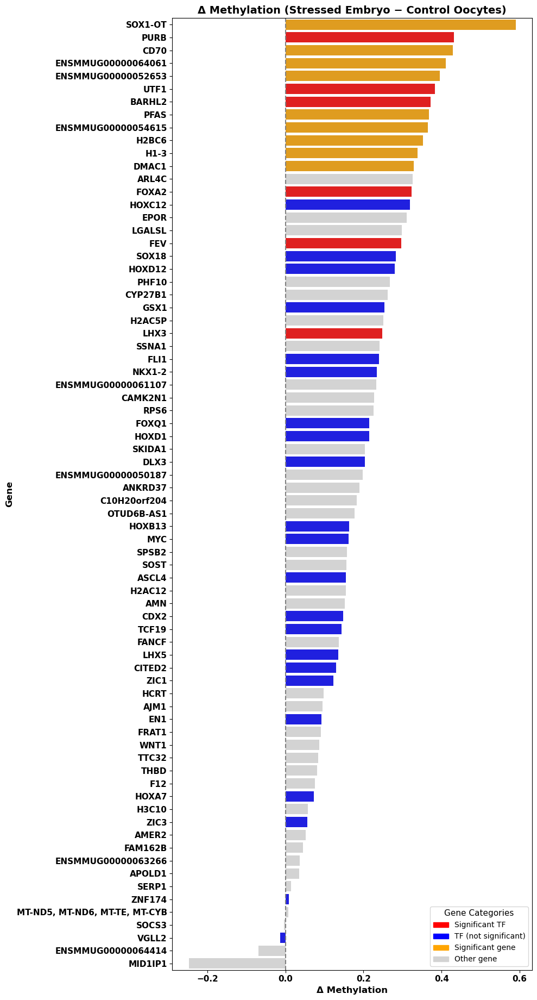

In [18]:
# with pvaue 

# ── Compare Control Oocytes vs Stressed Embryos – Δ Methylation per Gene ──

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os
from scipy.stats import ttest_ind
from statsmodels.stats.multitest import multipletests

# ── Step 1: Define transcription factors ──
highlight_tfs = [
    'BARHL2', 'FOXA2', 'SOX18', 'HOXC12', 'ASCL4', 'LHX5', 'EN1', 
    'HOXD12', 'HOXD1', 'FEV', 'LHX3', 'DLX3', 'HOXB13', 'GSX1', 
    'CDX2', 'ZIC1', 'ZNF174', 'PURB', 'HOXA7', 'VGLL2', 'CITED2', 
    'TCF19', 'FOXQ1', 'MYC', 'NKX1-2', 'FLI1', 'UTF1', 'ZIC3'
]

# ── Step 1: Load the gene list ──
genes_df = pd.read_csv("../../alloocytes/results-pooled/mCG_genenames_coords_withlifted.csv", sep=",")
genes_df.columns = ["gene_id", "chr", "start", "end", "genename"]
target_genes = genes_df['gene_id'].dropna().unique()
gene_id_to_name = genes_df.dropna(subset=['genename']).set_index("gene_id")["genename"].to_dict()

# ── Step 2: Filter control oocytes and stressed embryos ──
adata_oocyte_control = adataoocyte[adataoocyte.obs['Group'] == 'Control'].copy()
adata_embryo_stressed = adataembryo[adataembryo.obs['Group'] == 'Stressed'].copy()

# ── Step 3: Filter to target gene list ──
adata_oocyte_control = adata_oocyte_control[:, adata_oocyte_control.var['gene_id'].isin(target_genes)].copy()
adata_embryo_stressed = adata_embryo_stressed[:, adata_embryo_stressed.var['gene_id'].isin(target_genes)].copy()

# ── Step 4: Align genes by gene_id ──
oocyte_var = adata_oocyte_control.var.set_index("gene_id")
embryo_var = adata_embryo_stressed.var.set_index("gene_id")
common_gene_ids = np.intersect1d(oocyte_var.index, embryo_var.index)

adata_oocyte_control = adata_oocyte_control[:, oocyte_var.loc[common_gene_ids].index]
adata_embryo_stressed = adata_embryo_stressed[:, embryo_var.loc[common_gene_ids].index]

# ── Step 5: Compute mean methylation per gene ──
def mean_meth(adata):
    X = adata.layers['methylation_fraction']
    return np.ravel(X.mean(axis=0).A1 if hasattr(X, "A1") else X.mean(axis=0))

oocyte_means = mean_meth(adata_oocyte_control)
embryo_means = mean_meth(adata_embryo_stressed)

# ── Step 6: Build dataframe ──
meth_df = pd.DataFrame({
    'gene_id': common_gene_ids,
    'genename': [gene_id_to_name.get(gid, gid) for gid in common_gene_ids],
    'oocyte_mean': oocyte_means,
    'embryo_mean': embryo_means
})
meth_df['delta'] = meth_df['embryo_mean'] - meth_df['oocyte_mean']

# ── Step X: Flag TFs ──
highlight_tfs_set = set(highlight_tfs)
meth_df['is_tf'] = meth_df['genename'].isin(highlight_tfs_set)

# ── Step 7: Per-gene t-test and FDR correction ──
X_oocyte = adata_oocyte_control.layers['methylation_fraction']
X_embryo = adata_embryo_stressed.layers['methylation_fraction']
X_oocyte = X_oocyte.toarray() if hasattr(X_oocyte, 'toarray') else X_oocyte
X_embryo = X_embryo.toarray() if hasattr(X_embryo, 'toarray') else X_embryo

pvals = []
for i in range(X_oocyte.shape[1]):
    oocyte_vals = X_oocyte[:, i]
    embryo_vals = X_embryo[:, i]
    _, pval = ttest_ind(embryo_vals, oocyte_vals, equal_var=False)
    pvals.append(pval)

meth_df['pval'] = pvals
meth_df['fdr'] = multipletests(meth_df['pval'], method='fdr_bh')[1]
meth_df['significant'] = (meth_df['fdr'] < 0.05) & (meth_df['delta'].abs() > 0.1)

# ── Step 8: Save results ──
meth_df.sort_values('delta', ascending=False, inplace=True)
os.makedirs("embryo-only/comparison_outputs", exist_ok=True)
meth_df.to_csv("embryo-only/comparison_outputs/control_oocytes_vs_stressed_embryos_delta_with_stats.csv", index=False)
meth_df[meth_df['significant']].to_csv("embryo-only/comparison_outputs/control_oocytes_vs_stressed_embryos__significant_delta_genes.csv", index=False)

# ── Step 9: Plot Δ methylation ──
plt.figure(figsize=(10, max(6, 0.25 * len(meth_df))))
colors = []
for _, row in meth_df.iterrows():
    if row['significant'] and row['is_tf']:
        colors.append('red')      # Significant TF
    elif row['is_tf']:
        colors.append('blue')     # Non-significant TF
    elif row['significant']:
        colors.append('orange')   # Significant non-TF
    else:
        colors.append('lightgray')  # Not significant, not TF


sns.barplot(
    data=meth_df,
    x='delta',
    y='genename',
    palette=colors,
    dodge=False
)



# Create legend handles
legend_patches = [
    mpatches.Patch(color='red', label='Significant TF'),
    mpatches.Patch(color='blue', label='TF (not significant)'),
    mpatches.Patch(color='orange', label='Significant gene'),
    mpatches.Patch(color='lightgray', label='Other gene')
]

plt.legend(handles=legend_patches, title="Gene Categories", fontsize=10, title_fontsize=11, loc='lower right')

plt.axvline(0, linestyle='--', color='gray')
plt.title("Δ Methylation (Stressed Embryo − Control Oocytes)", fontsize=14, fontweight='bold')
plt.xlabel("Δ Methylation", fontsize=12, fontweight='bold')
plt.ylabel("Gene", fontsize=12, fontweight='bold')
plt.xticks(fontsize=11, fontweight='bold')
plt.yticks(fontsize=11, fontweight='bold')
plt.tight_layout()

# Save figure
os.makedirs("embryo-only/comparison_outputs_controloocytes", exist_ok=True)
plt.savefig("embryo-only/comparison_outputs_controloocytes/control_oocytes_vs_stressed_embryos_delta_methylation_barplot_significant.png", dpi=300)
plt.show()


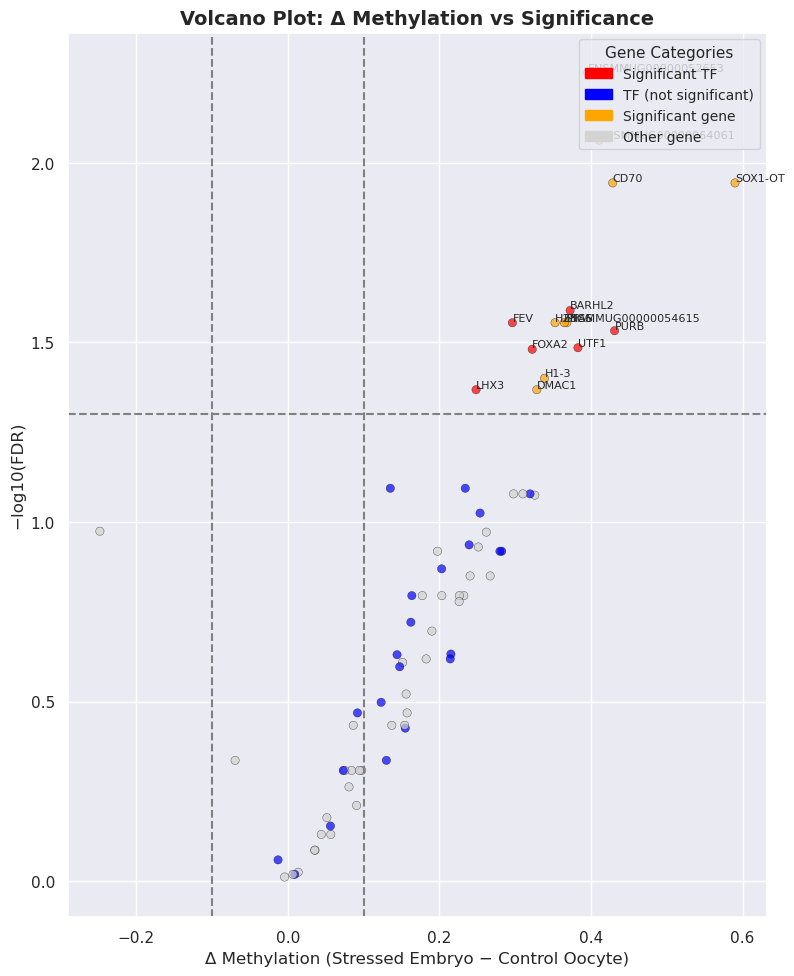

In [88]:
# ── Volcano Plot ──
plt.figure(figsize=(8, 10))

# Prepare plot values
x = meth_df['delta']
y = -np.log10(meth_df['fdr'].replace(0, 1e-300))  # Avoid -inf

# Define colors
colors = []
for _, row in meth_df.iterrows():
    if row['significant'] and row['is_tf']:
        colors.append('red')
    elif row['is_tf']:
        colors.append('blue')
    elif row['significant']:
        colors.append('orange')
    else:
        colors.append('lightgray')

# Scatter plot
plt.scatter(x, y, c=colors, alpha=0.7, edgecolor='black', linewidth=0.3)

# Add thresholds lines
plt.axhline(-np.log10(0.05), linestyle='--', color='gray', label='FDR = 0.05')
plt.axvline(-0.1, linestyle='--', color='gray')
plt.axvline(0.1, linestyle='--', color='gray')

# Labels
plt.title("Volcano Plot: Δ Methylation vs Significance", fontsize=14, fontweight='bold')
plt.xlabel("Δ Methylation (Stressed Embryo − Control Oocyte)", fontsize=12)
plt.ylabel("−log10(FDR)", fontsize=12)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)

# Custom legend
import matplotlib.patches as mpatches
legend_patches = [
    mpatches.Patch(color='red', label='Significant TF'),
    mpatches.Patch(color='blue', label='TF (not significant)'),
    mpatches.Patch(color='orange', label='Significant gene'),
    mpatches.Patch(color='lightgray', label='Other gene')
]
plt.legend(handles=legend_patches, fontsize=10, title="Gene Categories", title_fontsize=11, loc='upper right')

plt.tight_layout()

# Annotate significant genes
for _, row in meth_df[meth_df['significant']].iterrows():
    plt.text(
        row['delta'], 
        -np.log10(max(row['fdr'], 1e-300)), 
        row['genename'], 
        fontsize=8, 
        ha='right' if row['delta'] < 0 else 'left',
        va='bottom'
    )

# Save
plt.savefig("embryo-only/comparison_outputs_controloocytes/volcano_plot_stressedEControlO.png", dpi=300)
plt.show()


/tmp/ipykernel_3778582/99918476.py:101: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


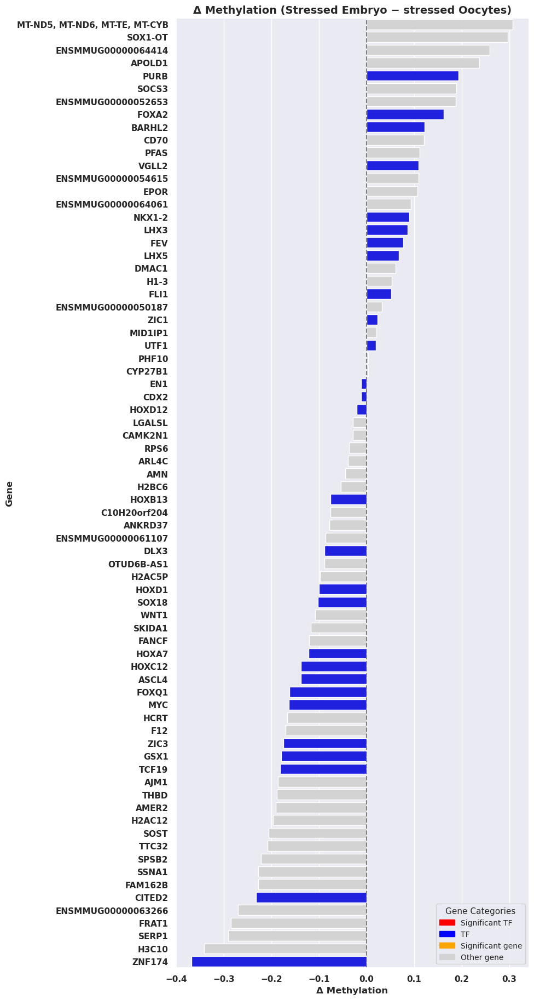

In [90]:
# with pvaue -

# ── Compare stress  Oocytes vs Stressed Embryos – Δ Methylation per Gene ──

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os
from scipy.stats import ttest_ind
from statsmodels.stats.multitest import multipletests

# ── Step 1: Define transcription factors ──
highlight_tfs = [
    'BARHL2', 'FOXA2', 'SOX18', 'HOXC12', 'ASCL4', 'LHX5', 'EN1', 
    'HOXD12', 'HOXD1', 'FEV', 'LHX3', 'DLX3', 'HOXB13', 'GSX1', 
    'CDX2', 'ZIC1', 'ZNF174', 'PURB', 'HOXA7', 'VGLL2', 'CITED2', 
    'TCF19', 'FOXQ1', 'MYC', 'NKX1-2', 'FLI1', 'UTF1', 'ZIC3'
]

# ── Step 1: Load the gene list ──
genes_df = pd.read_csv("../../alloocytes/results-pooled/mCG_genenames_coords_withlifted.csv", sep=",")
genes_df.columns = ["gene_id", "chr", "start", "end", "genename"]
target_genes = genes_df['gene_id'].dropna().unique()
gene_id_to_name = genes_df.dropna(subset=['genename']).set_index("gene_id")["genename"].to_dict()

# ── Step 2: Filter control oocytes and stressed embryos ──
adata_oocyte_stressed = adataoocyte[adataoocyte.obs['Group'] == 'Stressed'].copy()
adata_embryo_stressed = adataembryo[adataembryo.obs['Group'] == 'Stressed'].copy()

# ── Step 3: Filter to target gene list ──
adata_oocyte_stressed = adata_oocyte_stressed[:, adata_oocyte_stressed.var['gene_id'].isin(target_genes)].copy()
adata_embryo_stressed = adata_embryo_stressed[:, adata_embryo_stressed.var['gene_id'].isin(target_genes)].copy()

# ── Step 4: Align genes by gene_id ──
oocyte_var = adata_oocyte_stressed.var.set_index("gene_id")
embryo_var = adata_embryo_stressed.var.set_index("gene_id")
common_gene_ids = np.intersect1d(oocyte_var.index, embryo_var.index)

adata_oocyte_stressed = adata_oocyte_stressed[:, oocyte_var.loc[common_gene_ids].index]
adata_embryo_stressed = adata_embryo_stressed[:, embryo_var.loc[common_gene_ids].index]

# ── Step 5: Compute mean methylation per gene ──
def mean_meth(adata):
    X = adata.layers['methylation_fraction']
    return np.ravel(X.mean(axis=0).A1 if hasattr(X, "A1") else X.mean(axis=0))

oocyte_means = mean_meth(adata_oocyte_stressed)
embryo_means = mean_meth(adata_embryo_stressed)

# ── Step 6: Build dataframe ──
meth_df = pd.DataFrame({
    'gene_id': common_gene_ids,
    'genename': [gene_id_to_name.get(gid, gid) for gid in common_gene_ids],
    'oocyte_mean': oocyte_means,
    'embryo_mean': embryo_means
})
meth_df['delta'] = meth_df['embryo_mean'] - meth_df['oocyte_mean']

# ── Step X: Flag TFs ──
highlight_tfs_set = set(highlight_tfs)
meth_df['is_tf'] = meth_df['genename'].isin(highlight_tfs_set)

# ── Step 7: Per-gene t-test and FDR correction ──
X_oocyte = adata_oocyte_stressed.layers['methylation_fraction']
X_embryo = adata_embryo_stressed.layers['methylation_fraction']
X_oocyte = X_oocyte.toarray() if hasattr(X_oocyte, 'toarray') else X_oocyte
X_embryo = X_embryo.toarray() if hasattr(X_embryo, 'toarray') else X_embryo

pvals = []
for i in range(X_oocyte.shape[1]):
    oocyte_vals = X_oocyte[:, i]
    embryo_vals = X_embryo[:, i]
    _, pval = ttest_ind(embryo_vals, oocyte_vals, equal_var=False)
    pvals.append(pval)

meth_df['pval'] = pvals
meth_df['fdr'] = multipletests(meth_df['pval'], method='fdr_bh')[1]
meth_df['significant'] = (meth_df['fdr'] < 0.05) & (meth_df['delta'].abs() > 0.1)

# ── Step 8: Save results ──
meth_df.sort_values('delta', ascending=False, inplace=True)
os.makedirs("embryo-only/comparison_outputs", exist_ok=True)
meth_df.to_csv("embryo-only/comparison_outputs/stressed_oocytes_vs_stressed_embryos_delta_with_stats.csv", index=False)
meth_df[meth_df['significant']].to_csv("comparison_outputs/stressed_oocytes_vs_stressed_embryos_significant_delta_genes.csv", index=False)

# ── Step 9: Plot Δ methylation ──
plt.figure(figsize=(10, max(6, 0.25 * len(meth_df))))
colors = []
for _, row in meth_df.iterrows():
    if row['significant'] and row['is_tf']:
        colors.append('red')      # Significant TF
    elif row['is_tf']:
        colors.append('blue')     # Non-significant TF
    elif row['significant']:
        colors.append('orange')   # Significant non-TF
    else:
        colors.append('lightgray')  # Not significant, not TF


sns.barplot(
    data=meth_df,
    x='delta',
    y='genename',
    palette=colors,
    dodge=False
)



# Create legend handles
legend_patches = [
    mpatches.Patch(color='red', label='Significant TF'),
    mpatches.Patch(color='blue', label='TF'),
    mpatches.Patch(color='orange', label='Significant gene'),
    mpatches.Patch(color='lightgray', label='Other gene')
]

plt.legend(handles=legend_patches, title="Gene Categories", fontsize=10, title_fontsize=11, loc='lower right')

plt.axvline(0, linestyle='--', color='gray')
plt.title("Δ Methylation (Stressed Embryo − stressed Oocytes)", fontsize=14, fontweight='bold')
plt.xlabel("Δ Methylation", fontsize=12, fontweight='bold')
plt.ylabel("Gene", fontsize=12, fontweight='bold')
plt.xticks(fontsize=11, fontweight='bold')
plt.yticks(fontsize=11, fontweight='bold')
plt.tight_layout()

# Save figure
os.makedirs("embryo-only/comparison_outputs_controloocytes", exist_ok=True)
plt.savefig("embryo-only/comparison_outputs_controloocytes/stressed_oocytes_vs_stressed_embryos_delta_methylation_barplot_significant.png", dpi=300)
plt.show()


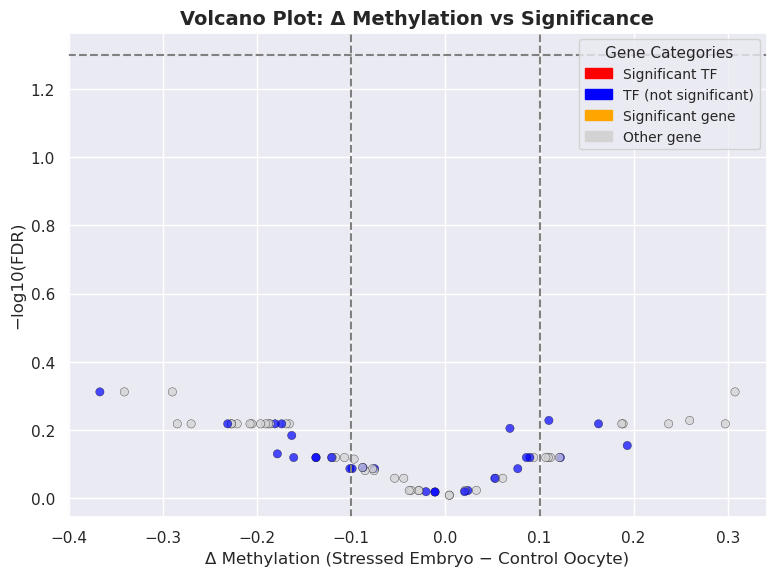

In [91]:
# ── Volcano Plot ──
plt.figure(figsize=(8, 6))

# Prepare plot values
x = meth_df['delta']
y = -np.log10(meth_df['fdr'].replace(0, 1e-300))  # Avoid -inf

# Define colors
colors = []
for _, row in meth_df.iterrows():
    if row['significant'] and row['is_tf']:
        colors.append('red')
    elif row['is_tf']:
        colors.append('blue')
    elif row['significant']:
        colors.append('orange')
    else:
        colors.append('lightgray')

# Scatter plot
plt.scatter(x, y, c=colors, alpha=0.7, edgecolor='black', linewidth=0.3)

# Add thresholds lines
plt.axhline(-np.log10(0.05), linestyle='--', color='gray', label='FDR = 0.05')
plt.axvline(-0.1, linestyle='--', color='gray')
plt.axvline(0.1, linestyle='--', color='gray')

# Labels
plt.title("Volcano Plot: Δ Methylation vs Significance", fontsize=14, fontweight='bold')
plt.xlabel("Δ Methylation (Stressed Embryo − Control Oocyte)", fontsize=12)
plt.ylabel("−log10(FDR)", fontsize=12)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)

# Custom legend
import matplotlib.patches as mpatches
legend_patches = [
    mpatches.Patch(color='red', label='Significant TF'),
    mpatches.Patch(color='blue', label='TF (not significant)'),
    mpatches.Patch(color='orange', label='Significant gene'),
    mpatches.Patch(color='lightgray', label='Other gene')
]
plt.legend(handles=legend_patches, fontsize=10, title="Gene Categories", title_fontsize=11, loc='upper right')

plt.tight_layout()

# Annotate significant genes
for _, row in meth_df[meth_df['significant']].iterrows():
    plt.text(
        row['delta'], 
        -np.log10(max(row['fdr'], 1e-300)), 
        row['genename'], 
        fontsize=8, 
        ha='right' if row['delta'] < 0 else 'left',
        va='bottom'
    )

# Save
plt.savefig("embryo-only/comparison_outputs_controloocytes/volcano_plot_StressedEandO.png", dpi=300)
plt.show()


In [17]:
# summary 

import pandas as pd

# ── Step 1: Load data from all 3 comparisons ──
df1 = pd.read_csv("embryo-only/comparison_outputs/stressed_oocytes_vs_stressed_embryos_delta_with_stats.csv")  # Embryo − Stressed Oocytes
df2 = pd.read_csv("embryo-only/comparison_outputs/control_oocytes_vs_stressed_embryos_delta_with_stats.csv")   # Embryo − Control Oocytes
df3 = pd.read_csv("oocyte-only/comparison_outputs/control_vs_stressed_oocytes_delta_with_stats.csv")                       # Stressed Oocytes − Control Oocytes

# ── Step 2: Rename columns to reflect comparison ──
df1 = df1.rename(columns={'delta': 'delta_embryo_vs_stressed_oocyte', 'significant': 'sig_embryo_vs_stressed_oocyte'})
df2 = df2.rename(columns={'delta': 'delta_embryo_vs_control_oocyte', 'significant': 'sig_embryo_vs_control_oocyte'})
df3 = df3.rename(columns={'delta': 'delta_stressed_vs_control_oocyte', 'significant': 'sig_stressed_vs_control_oocyte'})

# ── Step 3: Merge on gene_id or genename ──
merge_cols = ['gene_id', 'genename']
df_merged = df1[merge_cols + ['delta_embryo_vs_stressed_oocyte', 'sig_embryo_vs_stressed_oocyte']] \
    .merge(df2[merge_cols + ['delta_embryo_vs_control_oocyte', 'sig_embryo_vs_control_oocyte']], on=merge_cols) \
    .merge(df3[merge_cols + ['delta_stressed_vs_control_oocyte', 'sig_stressed_vs_control_oocyte']], on=merge_cols)

# ── Step 4: Sort by a comparison of interest ──
df_merged.sort_values(by='delta_embryo_vs_control_oocyte', ascending=False, inplace=True)

# ── Step 5: Save summary ──
df_merged.to_csv("oocyte-only/comparison_outputs/combined_methylation_delta_summary_threefigures.csv", index=False)

# ── Step 6: Optional preview ──
print(df_merged.head(10))


               gene_id            genename  delta_embryo_vs_stressed_oocyte  \
1   ENSMMUG00000056576             SOX1-OT                         0.297413   
4   ENSMMUG00000047932                PURB                         0.193231   
9   ENSMMUG00000011042                CD70                         0.121163   
14  ENSMMUG00000064061  ENSMMUG00000064061                         0.093731   
6   ENSMMUG00000052653  ENSMMUG00000052653                         0.187328   
25  ENSMMUG00000065350                UTF1                         0.020410   
8   ENSMMUG00000053737              BARHL2                         0.122153   
10  ENSMMUG00000063889                PFAS                         0.111638   
12  ENSMMUG00000054615  ENSMMUG00000054615                         0.109273   
36  ENSMMUG00000061648               H2BC6                        -0.054012   

    sig_embryo_vs_stressed_oocyte  delta_embryo_vs_control_oocyte  \
1                           False                        0.58

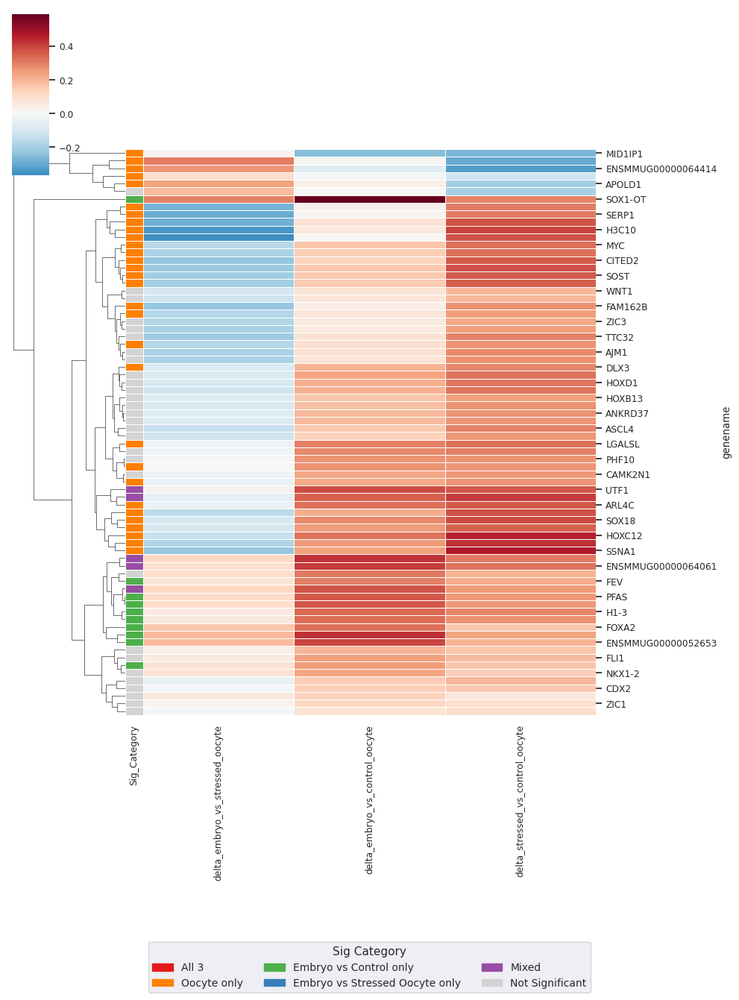

In [25]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# ── Load merged summary file ──
df = pd.read_csv("oocyte-only/comparison_outputs/combined_methylation_delta_summary_threefigures.csv")

# ── Define significance category ──
def categorize(row):
    s1 = row['sig_embryo_vs_stressed_oocyte']
    s2 = row['sig_embryo_vs_control_oocyte']
    s3 = row['sig_stressed_vs_control_oocyte']
    
    if s1 and s2 and s3:
        return 'All 3'
    elif s3 and not (s1 or s2):
        return 'Oocyte only'
    elif s2 and not (s1 or s3):
        return 'Embryo vs Control only'
    elif s1 and not (s2 or s3):
        return 'Embryo vs Stressed Oocyte only'
    elif any([s1, s2, s3]):
        return 'Mixed'
    else:
        return 'Not Significant'

df['Sig_Category'] = df.apply(categorize, axis=1)

# ── Reformat for heatmap ──
df_heat = df[['genename', 
              'delta_embryo_vs_stressed_oocyte', 
              'delta_embryo_vs_control_oocyte', 
              'delta_stressed_vs_control_oocyte', 
              'Sig_Category']].set_index('genename')

# ── Define color palette for row categories ──
row_colors_map = {
    'All 3': '#e41a1c',
    'Oocyte only': '#ff7f00',
    'Embryo vs Control only': '#4daf4a',
    'Embryo vs Stressed Oocyte only': '#377eb8',
    'Mixed': '#984ea3',
    'Not Significant': 'lightgray'
}
row_colors = df_heat['Sig_Category'].map(row_colors_map)

# ── Extract matrix and plot ──
heatmap_data = df_heat.drop(columns='Sig_Category')

sns.set(font_scale=0.8)
g = sns.clustermap(
    heatmap_data,
    row_colors=row_colors,
    cmap='RdBu_r',
    center=0,
    figsize=(10, 12),
    linewidths=0.5,
    col_cluster=False,
    row_cluster=True
)

# Add legend manually
# Add invisible bars for custom legend
from matplotlib.patches import Patch

legend_handles = [
    Patch(color=color, label=label) for label, color in row_colors_map.items()
]

# Move the legend below the heatmap
g.ax_heatmap.legend(
    handles=legend_handles,
    title="Sig Category",
    bbox_to_anchor=(0.5, -0.5),
    loc="lower center",
    ncol=3,
    fontsize=10,
    title_fontsize=11
)

# ── Save figure ──
plt.savefig("oocyte-only/comparison_outputs/heatmap_delta_methylation_significance.png", dpi=300, bbox_inches='tight')
plt.show()


Mann–Whitney U test p-value (embryos): 2.045e-07


/tmp/ipykernel_1811676/576213096.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x='Group', y='Methylation', inner='box', palette='pastel', cut=0)


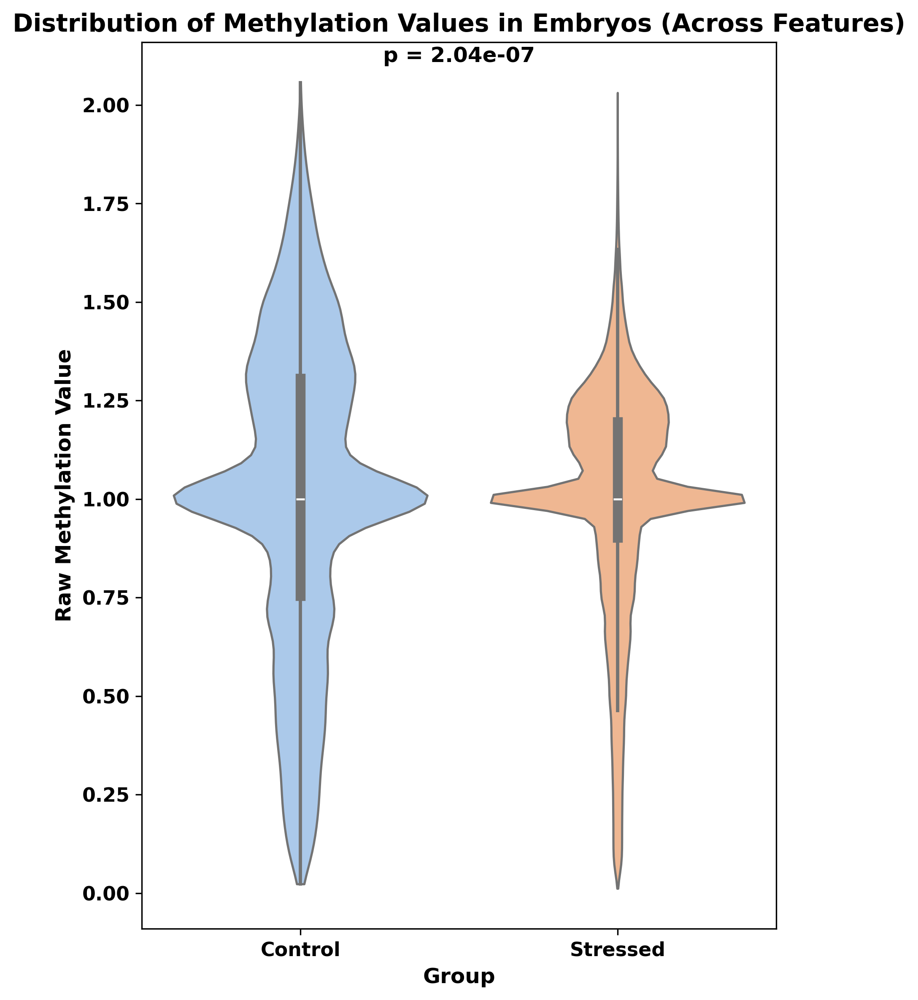

In [20]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
from scipy.stats import mannwhitneyu

# ── Step 1: Flatten methylation values ──
def flatten_methylation(adata):
    X = adata.layers['methylation_fraction']
    X = X.toarray() if hasattr(X, 'toarray') else X
    return X.flatten()

# ── Step 2: Subset embryo groups ──
adata_embryo_control = adataembryo[adataembryo.obs['Group'] == 'Control']
adata_embryo_stressed = adataembryo[adataembryo.obs['Group'] == 'Stressed']

# ── Step 3: Extract raw methylation values ──
mvals_control = flatten_methylation(adata_embryo_control)
mvals_stressed = flatten_methylation(adata_embryo_stressed)

# ── Step 4: Combine into DataFrame ──
df = pd.DataFrame({
    'Methylation': np.concatenate([mvals_control, mvals_stressed]),
    'Group': ['Control'] * len(mvals_control) + ['Stressed'] * len(mvals_stressed)
})
df = df.dropna()

# ── Step 5: Mann–Whitney U test ──
u_stat, pval = mannwhitneyu(mvals_control, mvals_stressed, alternative='two-sided')
print(f"Mann–Whitney U test p-value (embryos): {pval:.3e}")

# ── Step 6: Plot violin ──
plt.figure(figsize=(6, 8))
sns.violinplot(data=df, x='Group', y='Methylation', inner='box', palette='pastel', cut=0)

# Annotate p-value
plt.text(
    0.5, df['Methylation'].max() * 1.02,
    f'p = {pval:.2e}',
    ha='center', va='bottom', fontsize=12, fontweight='bold'
)

plt.title("Distribution of Methylation Values in Embryos (Across Features)", fontsize=14, fontweight='bold')
plt.xlabel("Group", fontsize=12, fontweight='bold')
plt.ylabel("Raw Methylation Value", fontsize=12, fontweight='bold')
plt.xticks(fontsize=11, fontweight='bold')
plt.yticks(fontsize=11, fontweight='bold')
#plt.ylim(0, 1)
plt.tight_layout()

# ── Step 7: Save figure ──
os.makedirs("embryo-only/violinplots", exist_ok=True)
plt.savefig("embryo-only/violinplots/embryo_global_methylation_violinplot.png", dpi=300)
plt.show()


Embryo Stressed vs Oocyte Stressed – p = 5.146e-10


/tmp/ipykernel_1811676/3539776034.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x='Group', y='Methylation', inner='box', palette='pastel', cut=0)


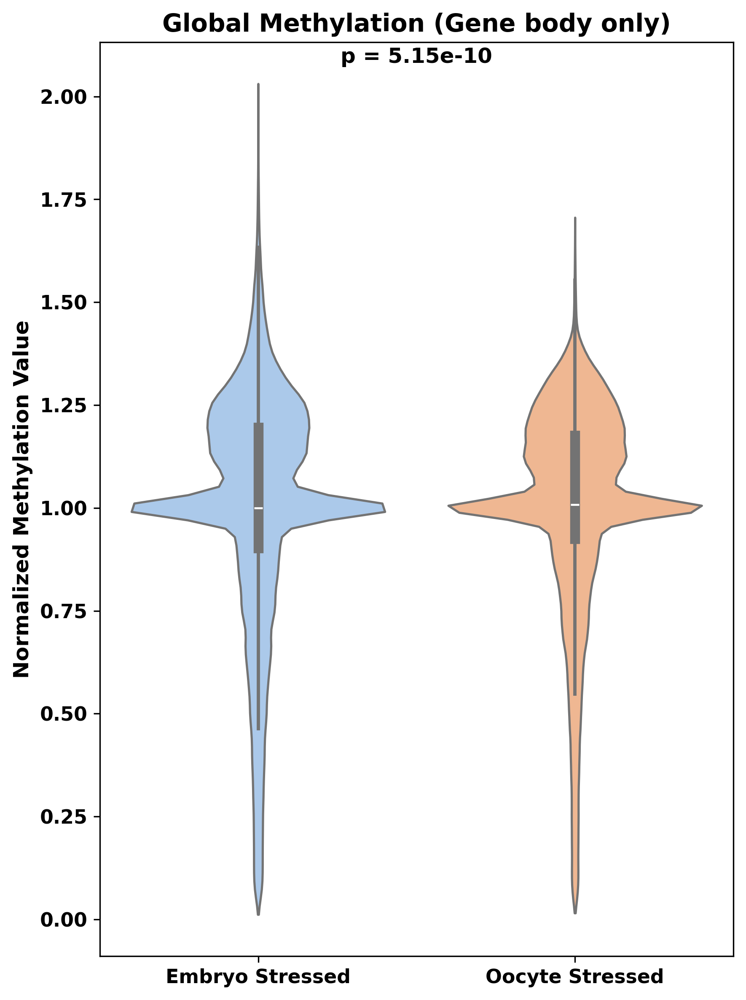

In [21]:
# embryo vs oocytes

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
from scipy.stats import mannwhitneyu

# ── Step 1: Flatten methylation matrix ──
def flatten_methylation(adata):
    X = adata.layers['methylation_fraction']
    X = X.toarray() if hasattr(X, 'toarray') else X
    return X.flatten()

# ── Step 2: Subset to stressed groups only ──
adata_embryo_stressed = adataembryo[adataembryo.obs['Group'] == 'Stressed']
adata_oocyte_stressed = adataoocyte[adataoocyte.obs['Group'] == 'Stressed']

# ── Step 3: Get raw methylation values ──
mvals_embryo_stressed = flatten_methylation(adata_embryo_stressed)
mvals_oocyte_stressed = flatten_methylation(adata_oocyte_stressed)

# ── Step 4: Combine into DataFrame ──
df = pd.DataFrame({
    'Methylation': np.concatenate([mvals_embryo_stressed, mvals_oocyte_stressed]),
    'Group': ['Embryo Stressed'] * len(mvals_embryo_stressed) +
             ['Oocyte Stressed'] * len(mvals_oocyte_stressed)
})
df = df.dropna()

# ── Step 5: Mann–Whitney U test ──
vals1 = df[df['Group'] == 'Embryo Stressed']['Methylation']
vals2 = df[df['Group'] == 'Oocyte Stressed']['Methylation']
_, pval = mannwhitneyu(vals1, vals2, alternative='two-sided')
print(f"Embryo Stressed vs Oocyte Stressed – p = {pval:.3e}")

# ── Step 6: Plot ──
plt.figure(figsize=(6, 8))
sns.violinplot(data=df, x='Group', y='Methylation', inner='box', palette='pastel', cut=0)

# Annotate p-value
plt.text(
    0.5, df['Methylation'].max() * 1.02,
    f'p = {pval:.2e}',
    ha='center', va='bottom', fontsize=12, fontweight='bold'
)

plt.title("Global Methylation (Gene body only)", fontsize=14, fontweight='bold')
plt.xlabel("", fontsize=12, fontweight='bold')
plt.ylabel("Normalized Methylation Value", fontsize=12, fontweight='bold')
plt.xticks(fontsize=11, fontweight='bold')
plt.yticks(fontsize=11, fontweight='bold')
plt.tight_layout()

# ── Step 7: Save ──
os.makedirs("oocyte-only/combined/violinplots", exist_ok=True)
#plt.savefig("oocyte-only/combined/violinplots/stressed_embryo_vs_oocyte_violinplot.png", dpi=300)
plt.savefig("oocyte-only/combined/violinplots/stressed_embryo_vs_oocyte_panelb-2_sf6.pdf", dpi=300)
plt.show()


Embryo Stressed vs Oocyte Control – p = 5.845e-36


/tmp/ipykernel_1811676/3849917395.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x='Group', y='Methylation', inner='box', palette='pastel', cut=0)


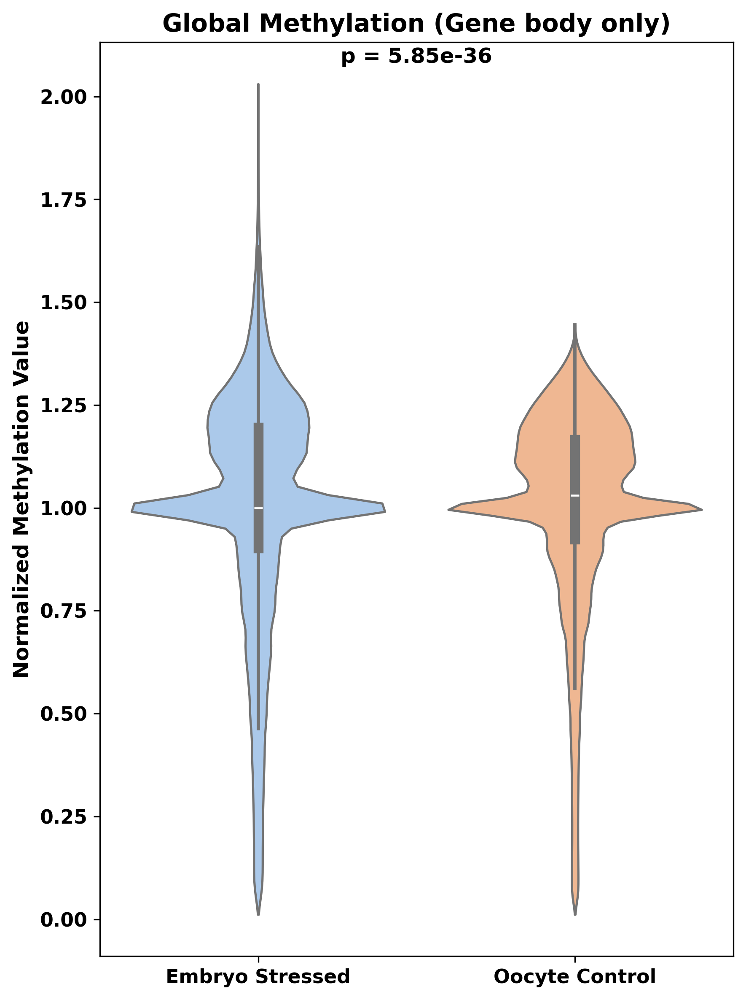

In [25]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
from scipy.stats import mannwhitneyu

# ── Step 1: Flatten methylation matrix ──
def flatten_methylation(adata):
    X = adata.layers['methylation_fraction']
    X = X.toarray() if hasattr(X, 'toarray') else X
    return X.flatten()

# ── Step 2: Subset to groups ──
adata_embryo_stressed = adataembryo[adataembryo.obs['Group'] == 'Stressed']
adata_oocyte_control = adataoocyte[adataoocyte.obs['Group'] == 'Control']

# ── Step 3: Get raw methylation values ──
mvals_embryo_stressed = flatten_methylation(adata_embryo_stressed)
mvals_oocyte_control = flatten_methylation(adata_oocyte_control)

# ── Step 4: Combine into DataFrame ──
df = pd.DataFrame({
    'Methylation': np.concatenate([mvals_embryo_stressed, mvals_oocyte_control]),
    'Group': ['Embryo Stressed'] * len(mvals_embryo_stressed) +
             ['Oocyte Control'] * len(mvals_oocyte_control)
})
df = df.dropna()

# ── Step 5: Mann–Whitney U test ──
vals1 = df[df['Group'] == 'Embryo Stressed']['Methylation']
vals2 = df[df['Group'] == 'Oocyte Control']['Methylation']
_, pval = mannwhitneyu(vals1, vals2, alternative='two-sided')
print(f"Embryo Stressed vs Oocyte Control – p = {pval:.3e}")

# ── Step 6: Plot ──
plt.figure(figsize=(6, 8))
sns.violinplot(data=df, x='Group', y='Methylation', inner='box', palette='pastel', cut=0)

# Annotate p-value
plt.text(
    0.5, df['Methylation'].max() * 1.02,
    f'p = {pval:.2e}',
    ha='center', va='bottom', fontsize=12, fontweight='bold'
)

plt.title("Global Methylation (Gene body only)", fontsize=14, fontweight='bold')
plt.xlabel("", fontsize=12, fontweight='bold')
plt.ylabel("Normalized Methylation Value", fontsize=12, fontweight='bold')
plt.xticks(fontsize=11, fontweight='bold')
plt.yticks(fontsize=11, fontweight='bold')
#plt.ylim(0, 1)
plt.tight_layout()

# ── Step 7: Save ──
os.makedirs("oocyte-only/combined/violinplots", exist_ok=True)
#plt.savefig("oocyte-only/combined/violinplots/stressed_embryo_vs_control_oocyte_violinplot.png", dpi=300)
plt.savefig("oocyte-only/combined/violinplots/stressed_embryo_vs_control_oocyte_panelb-1_sf6.pdf", dpi=300)
plt.show()


In [ ]:
adataoocyte = anndata.read_h5ad("../../alloocytes/results-pooled/hdWGBS/adataFromgenebodyFrac_mCG.h5ad")
adataoocyte.obs_names

Mann–Whitney U test p-value: 8.050e-06


/tmp/ipykernel_1811676/875518127.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x='Group', y='Methylation', inner='box', palette='pastel', cut=0)


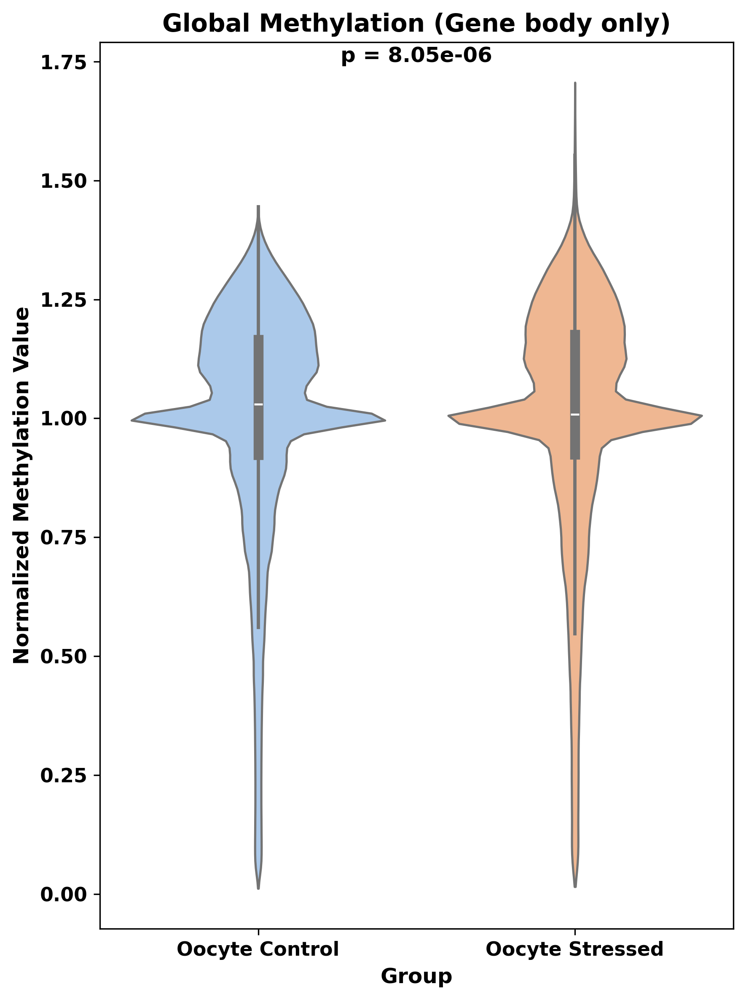

In [26]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
from scipy.stats import mannwhitneyu

# ── Step 1: Flatten methylation values ──
def flatten_methylation(adata):
    X = adata.layers['methylation_fraction']
    X = X.toarray() if hasattr(X, 'toarray') else X
    return X.flatten()

# ── Step 2: Subset groups ──
adata_oocyte_control = adataoocyte[adataoocyte.obs['Group'] == 'Control']
adata_oocyte_stressed = adataoocyte[adataoocyte.obs['Group'] == 'Stressed']

# ── Step 3: Get raw methylation values ──
mvals_control = flatten_methylation(adata_oocyte_control)
mvals_stressed = flatten_methylation(adata_oocyte_stressed)

# ── Step 4: Prepare data ──
df = pd.DataFrame({
    'Methylation': np.concatenate([mvals_control, mvals_stressed]),
    'Group': ['Oocyte Control'] * len(mvals_control) + ['Oocyte Stressed'] * len(mvals_stressed)
})
df = df.dropna()

# ── Step 5: Mann–Whitney U test ──
u_stat, pval = mannwhitneyu(mvals_control, mvals_stressed, alternative='two-sided')
print(f"Mann–Whitney U test p-value: {pval:.3e}")

# ── Step 6: Plot ──
plt.figure(figsize=(6, 8))
sns.violinplot(data=df, x='Group', y='Methylation', inner='box', palette='pastel', cut=0)

# Annotate p-value
plt.text(
    0.5, df['Methylation'].max() * 1.02,
    f'p = {pval:.2e}',
    ha='center', va='bottom', fontsize=12, fontweight='bold'
)

plt.title("Global Methylation (Gene body only)", fontsize=14, fontweight='bold')
plt.xlabel("Group", fontsize=12, fontweight='bold')
plt.ylabel("Normalized Methylation Value", fontsize=12, fontweight='bold')
plt.xticks(fontsize=11, fontweight='bold')
plt.yticks(fontsize=11, fontweight='bold')
#plt.ylim(0, 2.1)
plt.tight_layout()

# ── Step 7: Save plot ──
os.makedirs("oocyte-only/violinplots", exist_ok=True)
#plt.savefig("oocyte-only/violinplots/oocyte_methylation_violinplot_across_features.png", dpi=300)
plt.savefig("oocyte-only/violinplots/oocyte_methylation_panelb-3_sf6.pdf", dpi=300)
plt.show()


In [62]:
adataoocyte.X

<46x26940 sparse matrix of type '<class 'numpy.float32'>'
	with 1239240 stored elements in Compressed Sparse Row format>

Mann–Whitney U test p-value: 8.050e-06


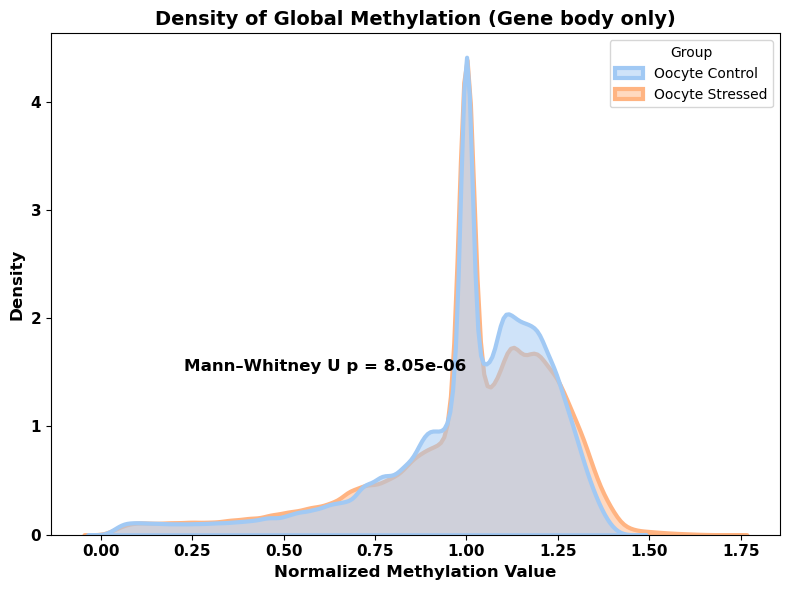

In [48]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
from scipy.stats import mannwhitneyu

# ── Step 1: Flatten methylation values ──
def flatten_methylation(adata):
    X = adata.layers['methylation_fraction']
    X = X.toarray() if hasattr(X, 'toarray') else X
    return X.flatten()

# ── Step 2: Subset groups ──
adata_oocyte_control = adataoocyte[adataoocyte.obs['Group'] == 'Control']
adata_oocyte_stressed = adataoocyte[adataoocyte.obs['Group'] == 'Stressed']

# ── Step 3: Get raw methylation values ──
mvals_control = flatten_methylation(adata_oocyte_control)
mvals_stressed = flatten_methylation(adata_oocyte_stressed)

# ── Step 4: Prepare data ──
df = pd.DataFrame({
    'Methylation': np.concatenate([mvals_control, mvals_stressed]),
    'Group': ['Oocyte Control'] * len(mvals_control) + ['Oocyte Stressed'] * len(mvals_stressed)
})
df = df.dropna()

# ── Step 5: Mann–Whitney U test ──
u_stat, pval = mannwhitneyu(mvals_control, mvals_stressed, alternative='two-sided')
print(f"Mann–Whitney U test p-value: {pval:.3e}")

# ── Step 6: Density Plot ──
plt.figure(figsize=(8, 6))
sns.kdeplot(data=df, x='Methylation', hue='Group',common_norm=False, palette='pastel', alpha=0.5, fill=True, 
            linewidth=3)

# Annotate p-value
plt.text(
    df['Methylation'].mean(), df['Methylation'].max() * 0.95,
    f'Mann–Whitney U p = {pval:.2e}', 
    ha='right', va='top', fontsize=12, fontweight='bold'
)

plt.title("Density of Global Methylation (Gene body only)", fontsize=14, fontweight='bold')
plt.xlabel("Normalized Methylation Value", fontsize=12, fontweight='bold')
plt.ylabel("Density", fontsize=12, fontweight='bold')
plt.xticks(fontsize=11, fontweight='bold')
plt.yticks(fontsize=11, fontweight='bold')
plt.tight_layout()

# ── Step 7: Save plot ──
os.makedirs("oocyte-only/densityplots", exist_ok=True)
plt.savefig("oocyte-only/densityplots/oocyte_methylation_densityplot_across_features_genebody.png", dpi=300)
plt.show()


Mann–Whitney U test p-value: 7.368e-02


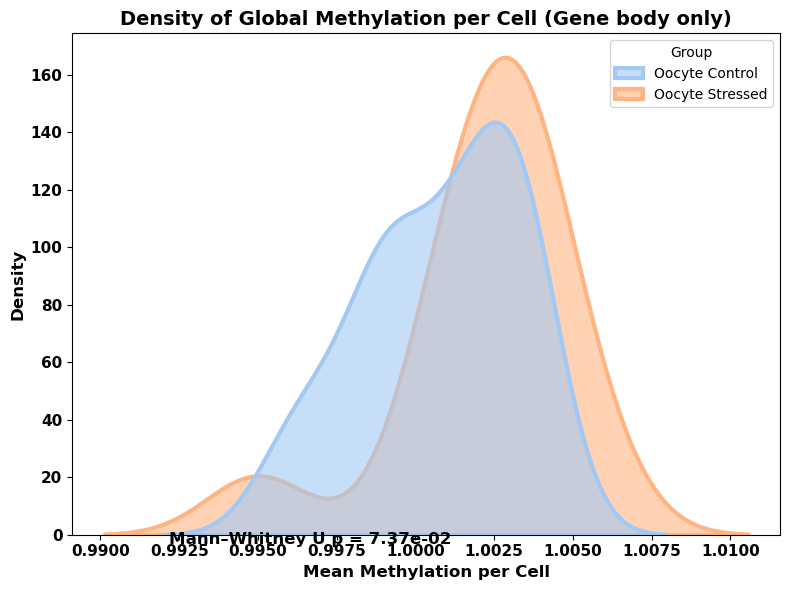

In [49]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
from scipy.stats import mannwhitneyu

# ── Step 1: Compute per-cell average methylation ──
def average_methylation_per_cell(adata):
    X = adata.layers['methylation_fraction']
    X = X.toarray() if hasattr(X, 'toarray') else X
    return X.mean(axis=1)  # mean across features for each cell

# ── Step 2: Subset groups ──
adata_oocyte_control = adataoocyte[adataoocyte.obs['Group'] == 'Control']
adata_oocyte_stressed = adataoocyte[adataoocyte.obs['Group'] == 'Stressed']

# ── Step 3: Get per-cell average methylation ──
mvals_control = average_methylation_per_cell(adata_oocyte_control)
mvals_stressed = average_methylation_per_cell(adata_oocyte_stressed)

# ── Step 4: Prepare data ──
df = pd.DataFrame({
    'Methylation': np.concatenate([mvals_control, mvals_stressed]),
    'Group': ['Oocyte Control'] * len(mvals_control) + ['Oocyte Stressed'] * len(mvals_stressed)
})
df = df.dropna()

# ── Step 5: Mann–Whitney U test ──
u_stat, pval = mannwhitneyu(mvals_control, mvals_stressed, alternative='two-sided')
print(f"Mann–Whitney U test p-value: {pval:.3e}")

# ── Step 6: Density Plot ──
plt.figure(figsize=(8, 6))
sns.kdeplot(data=df, x='Methylation', hue='Group', common_norm=False, palette='pastel', alpha=0.6, fill=True, linewidth=3)

# Annotate p-value
plt.text(
    df['Methylation'].mean(), df['Methylation'].max() * 0.95,
    f'Mann–Whitney U p = {pval:.2e}', 
    ha='right', va='top', fontsize=12, fontweight='bold'
)

plt.title("Density of Global Methylation per Cell (Gene body only)", fontsize=14, fontweight='bold')
plt.xlabel("Mean Methylation per Cell", fontsize=12, fontweight='bold')
plt.ylabel("Density", fontsize=12, fontweight='bold')
plt.xticks(fontsize=11, fontweight='bold')
plt.yticks(fontsize=11, fontweight='bold')
plt.tight_layout()

# ── Step 7: Save plot ──
os.makedirs("oocyte-only/densityplots", exist_ok=True)
plt.savefig("oocyte-only/densityplots/oocyte_methylation_densityplot_avg_per_cell_genebody.png", dpi=300)
plt.show()


/tmp/ipykernel_2388474/1131002976.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x='Group', y='Methylation', inner='box', palette='pastel')


<Axes: xlabel='Group', ylabel='Methylation'>

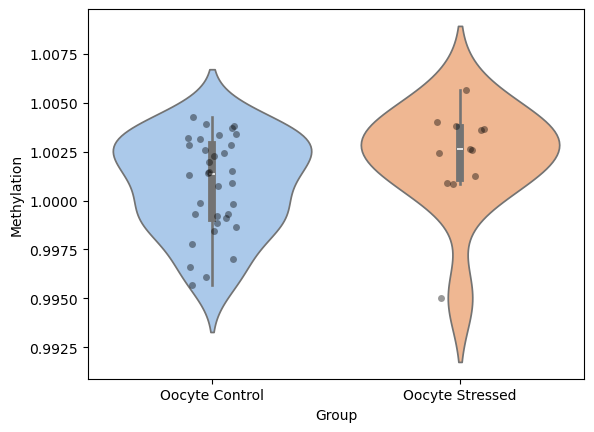

In [50]:
sns.violinplot(data=df, x='Group', y='Methylation', inner='box', palette='pastel')
sns.stripplot(data=df, x='Group', y='Methylation', color='k', alpha=0.4, jitter=True)


In [51]:
adataoocyte = anndata.read_h5ad("../../alloocytes/results-pooled/mCG.HVF.h5ad")
adataoocyte.obs_names

Index(['4146045001PO3NC4G4C', '4129944963PO2NC4M1S', '4520844650PO1NC5A7S',
       '4146045001PO2NC3F4C', '4520844650PO2NC3B7S', '3905345005PO1NC2I1S',
       '4129944963PO1NC3N1S', '4211144957PO1NC3K4C', '4660644938PO2NC3A10C',
       '4139144923PO4NC4K3C', '4598244908PO1NC3J8C', '4598244908PO2NC4K8C',
       '4566944964PO2NC4C7C', '4129944963PO3NC3O1S', '4139144923PO3NC5J3C',
       '4566944964PO3NC3D8C', '4265145042PO3NC4G5S', '4598245001PO2NC4F8C',
       '4499445005PO2NC3C5C', '4660644993PO2NC5D10C', '4566944964PO4NC3E8C',
       '4660644938PO3NC5B10C', '4636344664PO1NC5L9C', '4566944700PO1NC5O8C',
       '4636344914PO1NC4H9C', '4265145042PO2NC4N4S', '4660644993PO3NC5E10C',
       '4211144957PO2NC3L4C', '3889744700PO1NC5D1S', '4265145042PO1NC3E5S',
       '4660644993PO4NC5F10C', '4146044643PO3NC5A4C', '4146045001PO1NC5E4C',
       '4139144650PO1NC4F3C', '4139144650PO2NC4G3C', '4520844650PO3NC5C8S',
       '4566944700PO2NC5P8C', '4146044643PO1NC5O3C', '4456444991PO1NC3H6C',
       

In [52]:
adataoocyte

AnnData object with n_obs × n_vars = 46 × 23803
    obs: 'leiden'
    var: 'chrom', 'end', 'start', 'CHN_mean', 'CHN_dispersion', 'CHN_cov', 'CHN_score', 'CHN_feature_select', 'CGN_mean', 'CGN_dispersion', 'CGN_cov', 'CGN_score', 'CGN_feature_select', 'leiden_enriched_features'
    uns: 'leiden', 'leiden_colors', 'leiden_feature_enrichment', 'log', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

In [53]:
# Load metadata
metadata_path = '../../CellMetadata_PassQC_alloocytes_withyear_mtreads_sub.csv'
metadata = pd.read_csv(metadata_path, index_col=0, sep="\t")

# Add Group and AnimalID to adata.obs
adataoocyte.obs['Group'] = metadata['Group']
adataoocyte.obs['AnimalID'] = metadata['AnimalID'].astype('category')
adataoocyte.obs['Year'] = metadata['Year'].astype(int)
adataoocyte.obs['Collection'] = metadata['Collection'].astype(int)
adataoocyte.obs

,leiden,Group,AnimalID,Year,Collection
cell,,,,,
4146045001PO3NC4G4C,0,Control,41460,2023,2
4129944963PO2NC4M1S,0,Stressed,41299,2023,1
4520844650PO1NC5A7S,2,Stressed,45208,2022,1
4146045001PO2NC3F4C,1,Control,41460,2023,2
4520844650PO2NC3B7S,2,Stressed,45208,2022,1
3905345005PO1NC2I1S,1,Stressed,39053,2023,1
4129944963PO1NC3N1S,0,Stressed,41299,2023,2
4211144957PO1NC3K4C,2,Control,42111,2023,1
4660644938PO2NC3A10C,1,Control,46606,2023,1


Mann–Whitney U test p-value: 2.681e-38


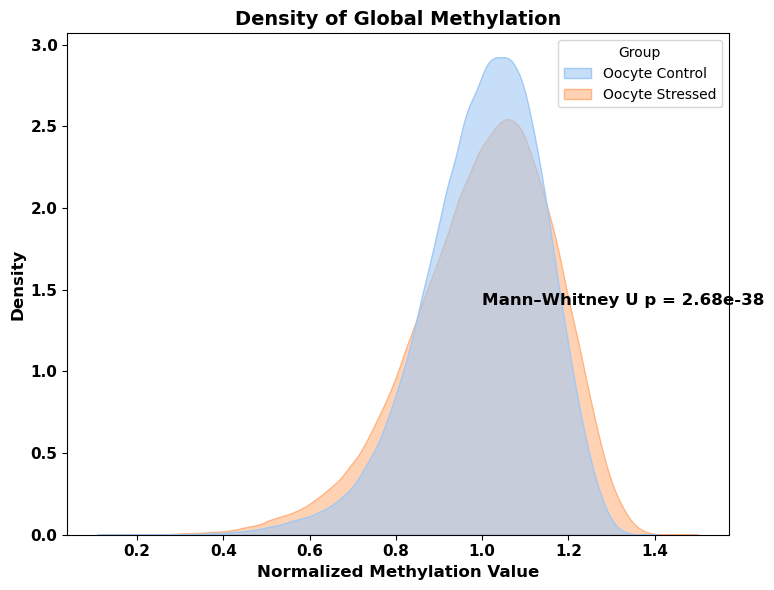

In [54]:
#global 100kb across cell*feature
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
from scipy.stats import mannwhitneyu

# ── Step 1: Flatten methylation values ──
def flatten_methylation(adata):
    X = adata.X
    X = X.toarray() if hasattr(X, 'toarray') else X
    return X.flatten()

# ── Step 2: Subset groups ──
adata_oocyte_control = adataoocyte[adataoocyte.obs['Group'] == 'Control']
adata_oocyte_stressed = adataoocyte[adataoocyte.obs['Group'] == 'Stressed']

# ── Step 3: Get raw methylation values ──
mvals_control = flatten_methylation(adata_oocyte_control)
mvals_stressed = flatten_methylation(adata_oocyte_stressed)

# ── Step 4: Prepare data ──
df = pd.DataFrame({
    'Methylation': np.concatenate([mvals_control, mvals_stressed]),
    'Group': ['Oocyte Control'] * len(mvals_control) + ['Oocyte Stressed'] * len(mvals_stressed)
})
df = df.dropna()

# ── Step 5: Mann–Whitney U test ──
u_stat, pval = mannwhitneyu(mvals_control, mvals_stressed, alternative='two-sided')
print(f"Mann–Whitney U test p-value: {pval:.3e}")

# ── Step 6: Density Plot ──
plt.figure(figsize=(8, 6))
sns.kdeplot(data=df, x='Methylation', hue='Group', fill=True, common_norm=False, palette='pastel',
            scale='width', alpha=0.6)

# Annotate p-value
plt.text(
    df['Methylation'].mean(), df['Methylation'].max() * 0.95,
    f'Mann–Whitney U p = {pval:.2e}',
    ha='left', va='bottom', fontsize=12, fontweight='bold'
)

plt.title("Density of Global Methylation", fontsize=14, fontweight='bold')
plt.xlabel("Normalized Methylation Value", fontsize=12, fontweight='bold')
plt.ylabel("Density", fontsize=12, fontweight='bold')
plt.xticks(fontsize=11, fontweight='bold')
plt.yticks(fontsize=11, fontweight='bold')
plt.tight_layout()

# ── Step 7: Save plot ──
os.makedirs("oocyte-only/densityplots", exist_ok=True)
plt.savefig("oocyte-only/densityplots/oocyte_methylation_densityplot_across_features_global.png", dpi=300)
plt.show()


In [ ]:
# make it similar to geom_density plot in r 

sns.kdeplot(data=df[df['Group'] == 'Oocyte Control'], x='Methylation', label='Control')
sns.kdeplot(data=df[df['Group'] == 'Oocyte Stressed'], x='Methylation', label='Stressed')
plt.legend()
plt.title("Density Plot of Methylation")
plt.show()


Mann–Whitney U test p-value: 3.482e-01


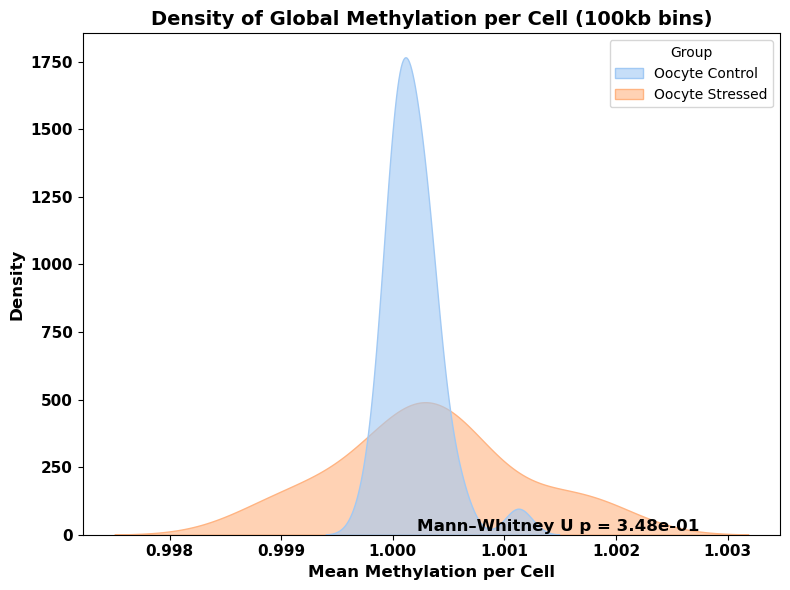

In [55]:
# global 100kb average features per cell 

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
from scipy.stats import mannwhitneyu

# ── Step 1: Compute average methylation per cell ──
def average_methylation_per_cell(adata):
    X = adata.X
    X = X.toarray() if hasattr(X, 'toarray') else X
    return X.mean(axis=1)  # average across features for each cell

# ── Step 2: Subset groups ──
adata_oocyte_control = adataoocyte[adataoocyte.obs['Group'] == 'Control']
adata_oocyte_stressed = adataoocyte[adataoocyte.obs['Group'] == 'Stressed']

# ── Step 3: Get per-cell average methylation ──
mvals_control = average_methylation_per_cell(adata_oocyte_control)
mvals_stressed = average_methylation_per_cell(adata_oocyte_stressed)

# ── Step 4: Prepare data ──
df = pd.DataFrame({
    'Methylation': np.concatenate([mvals_control, mvals_stressed]),
    'Group': ['Oocyte Control'] * len(mvals_control) + ['Oocyte Stressed'] * len(mvals_stressed)
})
df = df.dropna()

# ── Step 5: Mann–Whitney U test ──
u_stat, pval = mannwhitneyu(mvals_control, mvals_stressed, alternative='two-sided')
print(f"Mann–Whitney U test p-value: {pval:.3e}")

# ── Step 6: Density Plot ──
plt.figure(figsize=(8, 6))
sns.kdeplot(data=df, x='Methylation', hue='Group', fill=True, common_norm=False, palette='pastel', alpha=0.6)

# Annotate p-value
plt.text(
    df['Methylation'].mean(), df['Methylation'].max() * 0.95,
    f'Mann–Whitney U p = {pval:.2e}',
    ha='left', va='bottom', fontsize=12, fontweight='bold'
)

plt.title("Density of Global Methylation per Cell (100kb bins)", fontsize=14, fontweight='bold')
plt.xlabel("Mean Methylation per Cell", fontsize=12, fontweight='bold')
plt.ylabel("Density", fontsize=12, fontweight='bold')
plt.xticks(fontsize=11, fontweight='bold')
plt.yticks(fontsize=11, fontweight='bold')
plt.tight_layout()

# ── Step 7: Save plot ──
os.makedirs("oocyte-only/densityplots", exist_ok=True)
plt.savefig("oocyte-only/densityplots/oocyte_methylation_densityplot_avg_per_cell_100kb.png", dpi=300)
plt.show()


/tmp/ipykernel_2388474/1131002976.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x='Group', y='Methylation', inner='box', palette='pastel')


<Axes: xlabel='Group', ylabel='Methylation'>

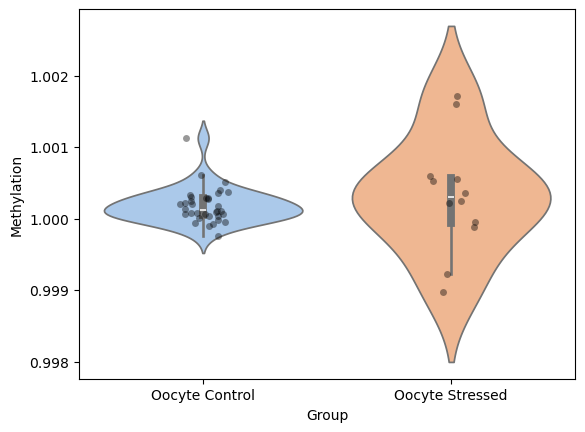

In [60]:
sns.violinplot(data=df, x='Group', y='Methylation', inner='box', palette='pastel')
sns.stripplot(data=df, x='Group', y='Methylation', color='k', alpha=0.4, jitter=True)


Mann–Whitney U test p-value: 8.050e-06
Mean methylation (Control): 1.001
Mean methylation (Stressed): 1.002


/tmp/ipykernel_677205/605031632.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x='Group', y='Methylation', inner='box', palette='pastel', cut=0)


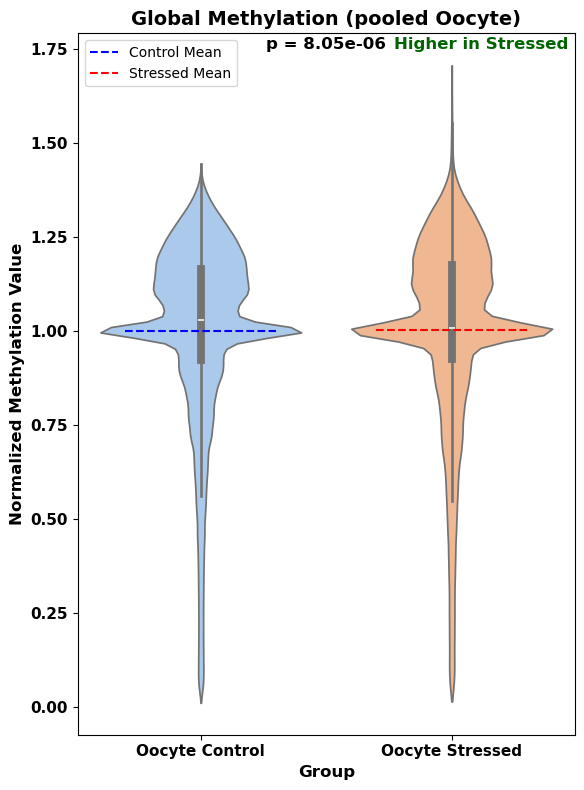

In [28]:
#global 100kb

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
from scipy.stats import mannwhitneyu

# ── Step 1: Flatten methylation values ──
def flatten_methylation(adata):
    X = adata.X
    X = X.toarray() if hasattr(X, 'toarray') else X
    return X.flatten()

# ── Step 2: Subset groups ──
adata_oocyte_control = adataoocyte[adataoocyte.obs['Group'] == 'Control']
adata_oocyte_stressed = adataoocyte[adataoocyte.obs['Group'] == 'Stressed']

# ── Step 3: Get raw methylation values ──
mvals_control = flatten_methylation(adata_oocyte_control)
mvals_stressed = flatten_methylation(adata_oocyte_stressed)

# ── Step 4: Prepare data ──
df = pd.DataFrame({
    'Methylation': np.concatenate([mvals_control, mvals_stressed]),
    'Group': ['Oocyte Control'] * len(mvals_control) + ['Oocyte Stressed'] * len(mvals_stressed)
})
df = df.dropna()

# ── Step 5: Mann–Whitney U test ──
u_stat, pval = mannwhitneyu(mvals_control, mvals_stressed, alternative='two-sided')
print(f"Mann–Whitney U test p-value: {pval:.3e}")

# step 6. Add group mean

mean_control = np.nanmean(mvals_control)
mean_stressed = np.nanmean(mvals_stressed)

print(f"Mean methylation (Control): {mean_control:.3f}")
print(f"Mean methylation (Stressed): {mean_stressed:.3f}")

# ── Step 7: Violin Plot ──
plt.figure(figsize=(6, 8))
sns.violinplot(data=df, x='Group', y='Methylation', inner='box', palette='pastel', cut=0)
#sns.stripplot(data=df, x='Group', y='Methylation', color='k', alpha=0.4, jitter=True)

# Annotate p-value
plt.text(
    0.5, df['Methylation'].max() * 1.02,
    f'p = {pval:.2e}',
    ha='center', va='bottom', fontsize=12, fontweight='bold'
)

# Add mean lines manually
plt.hlines(y=mean_control, xmin=-0.3, xmax=0.3, colors='blue', linestyles='dashed', label='Control Mean')
plt.hlines(y=mean_stressed, xmin=0.7, xmax=1.3, colors='red', linestyles='dashed', label='Stressed Mean')

if mean_control > mean_stressed:
    direction = "Higher in Control"
else:
    direction = "Higher in Stressed"

plt.text(
    0.77, df['Methylation'].max() * 1.02,
    direction,
    ha='left', va='bottom', fontsize=12, color='darkgreen', fontweight='bold'
)

plt.legend(loc='upper left')


plt.title("Global Methylation (pooled Oocyte)", fontsize=14, fontweight='bold')
plt.xlabel("Group", fontsize=12, fontweight='bold')
plt.ylabel("Normalized Methylation Value", fontsize=12, fontweight='bold')
plt.xticks(fontsize=11, fontweight='bold')
plt.yticks(fontsize=11, fontweight='bold')
plt.tight_layout()

# ── Step 7: Save plot ──
os.makedirs("oocyte-only/violinplots", exist_ok=True)
#plt.savefig("oocyte-only/violinplots/oocyte_methylation_violinplot_across_features_global.png", dpi=300)
plt.savefig("oocyte-only/violinplots/oocyte_methylation_violinplot_across_features_global.png", dpi=300)
plt.show()
